# Star Prediction Dataset

Author: </br>
Rama Chandra Kashyap Mamidipalli

# MIT License

Copyright (c) 2024 Rama Chandra Kashyap

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.

# Abstract

Hipparcos, a European mission, pinpointed the positions of more than one hundred thousand stars to high precision, and more than one million stars to lesser precision. Stars a primarily classified in two ways. First is the Morgan-Keenan classification. This classification is based on star temperature and color. Stars range in color from white, the hottest of all stars, to red, the coolest. Our own star, the Sun, is a class-G star. How these temperatures are determined is a complex mixture of spectral measurements. To explain it in a simple manner, light wavelengths emitted from the star are collected by telescopes.We will be predicting if the star is a Gaint or Dwarf classification.


#AIM:
To Predict if a Star belongs to the catagory of Dwarf or Giant based on the following attributes such as the parallel axis, Right and left assersions and other features, These features are extracted from Hipparcos, A European Satellite.

#Attributes:
RAhms: Right Ascention — Think of this as the “X-coordinate” in the celestial sphere. It helps astronomers pinpoint where a star is located.

DEdms: Declination — This is the “Y-coordinate” in the celestial sphere. Together with Right Ascention, it gives us a complete celestial GPS for stars.

Vmag: Magnitude — This is how we measure a star’s brightness. Lower values mean brighter stars, and yes, it can get negative for super bright objects!

Plx: Parallax — The apparent change in position of a star due to Earth’s orbit, because everything looks different from another angle. Useful for estimating distances to nearby stars.

pmRA: Proper Motion on RA Axis — This tells us how fast a star is moving across our line of sight in the Right Ascention direction.

pmDE: Proper Motion on DE Axis — Similar to H12, but this one’s about the star’s motion in the Declination direction.

e_RAdeg: Standard Error on H12 — The uncertainty in the Proper Motion on the RA axis. Smaller values mean more reliable measurements.

e_DEdeg: Standard Error on H13 — Same as H14, but for the Declination axis.

e_Plx: Standard Error on H11 — The uncertainty in the Parallax measurement. Again, smaller is better.

BTmag: Mean BT Magnitude — This uses the Tycho System 1 to measure blue wavelengths, which are related to a star’s temperature.

VTmag: Mean VT Magnitude — This uses Tycho System 2 to capture green-yellow wavelengths, related to what our eyes can actually see.

B-V: Johnson BV Color — A measure of a star’s color, which can give clues about its temperature and life stage.

Period: Period — The time it takes for a star to complete one cycle from its dimmest to its brightest state and back.

HvarType: Variability Type — Tells us how the star’s light varies over time. Categories include “None,” “Due to Duplicity,” “Micro,” “Periodical,” “Color Revised,” and “Unknown.”

MultFlag: Multiple Systems Flag — Indicates if a star is part of a multiple star system.

theta: Position Angle — The angle between components in binary or multiple star systems.

rho: Angular Separation — The apparent distance between components in multiple star systems.



r_SpType: Source of spectral type-

#  Data Types:
1. 17 physical characteristics of Star. "RAhms","BTmag","e_Plx","e_DEdeg","e_RAdeg","pmDE","pmRA","Plx","Vmag","DEdms","B-V","VTmag","V-I","Hpmag","e_B-V","e_V-I","r_Vmag" - The independent variables
2. The number of SpType - The dependent variable  
3. The number of SpType 2 types : Giant & Dwarf.
4. There are a total of 1500 observations.

##Target Data: SpType: Spectral type- Dwarf and Giant

In [74]:
# installing dependencies
!pip install eli5

In [75]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot

In [76]:
##Installing all the required libraries for the Assignment
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o

In [77]:
# Importing all the libararies required for the assignment
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from scipy.stats import pearsonr

sns.set(rc={"figure.figsize": (16, 8)})

In [78]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [79]:
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

5


In [80]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)
#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:54960..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmptam090_o
  JVM stdout: /tmp/tmptam090_o/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmptam090_o/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54960
Connecting to H2O server at http://127.0.0.1:54960 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_qxjuho
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


###Importing Data

In [81]:
# Reading the ablone dataset
data = pd.read_csv(
    "https://raw.githubusercontent.com/kashyap0729/DataScience/main/hipparcos.csv"
)

In [82]:
# Viewing data in the file
data.head()

,HIP,RAhms,BTmag,e_Plx,e_DEdeg,e_RAdeg,pmDE,pmRA,Plx,Vmag,...,Period,B-V,VTmag,V-I,Hpmag,e_B-V,e_V-I,r_Vmag,r_SpType,SpType
1,2,00 00 00.91,10.519,3.10,0.70,1.28,-0.93,181.21,21.90,9.27,...,NaN,0.999,9.378,1.04,9.4017,0.002,0.00,G,4,Dwarf
3,4,00 00 02.01,8.471,0.97,0.59,0.53,0.16,62.85,7.75,8.06,...,NaN,0.370,8.092,0.43,8.1498,0.009,0.01,H,2,Dwarf
4,5,00 00 02.39,9.693,1.11,0.61,0.64,9.07,2.53,2.87,8.55,...,NaN,0.902,8.656,0.90,8.7077,0.013,0.01,H,2,Giant
5,6,00 00 04.35,NaN,4.99,2.18,4.03,-12.84,226.29,18.80,12.31,...,NaN,1.336,NaN,1.55,12.4488,0.020,0.03,G,S,Dwarf
9,10,00 00 08.70,9.140,1.10,0.73,0.77,40.02,42.23,10.76,8.59,...,NaN,0.489,8.630,0.56,8.6994,0.011,0.01,H,2,Dwarf


# Assignment 1:

##Are there missing values?

In [83]:
# checking if the any data is missing
data.isnull().sum()

HIP             0
RAhms           0
BTmag         401
e_Plx          39
e_DEdeg        39
e_RAdeg        39
pmDE           39
pmRA           39
Plx            39
Vmag            0
DEdms           0
rho         41088
theta       41088
MultFlag    38712
HvarType    18499
Period      44398
B-V           106
VTmag         376
V-I           106
Hpmag           3
e_B-V         106
e_V-I         106
r_Vmag          0
r_SpType        0
SpType          0
dtype: int64

Data is missing from many of the columns, which means it is required to impute or remove the null values from the data

In [84]:
data=data.drop(['HIP','rho','theta','MultFlag','HvarType','Period','RAhms','DEdms'],axis=1)

###Filling the Data using mean and mode functions


In [85]:
##Handling Missing Values
data['BTmag'].fillna(np.mean(data['BTmag']), inplace=True)
data['e_Plx'].fillna(np.mean(data['e_Plx']), inplace=True)
data['e_DEdeg'].fillna(np.mean(data['e_DEdeg']), inplace=True)
data['e_RAdeg'].fillna(np.mean(data['e_RAdeg']), inplace=True)
data['pmDE'].fillna(np.mean(data['pmDE']), inplace=True)
data['pmRA'].fillna(np.mean(data['pmRA']), inplace=True)
data['Plx'].fillna(np.mean(data['Plx']), inplace=True)
data['Vmag'].fillna(np.mean(data['Vmag']), inplace=True)
data['B-V'].fillna(np.mean(data['B-V']), inplace=True)
data['VTmag'].fillna(np.mean(data['VTmag']), inplace=True)
data['V-I'].fillna(np.mean(data['V-I']), inplace=True)
data['Hpmag'].fillna(np.mean(data['Hpmag']), inplace=True)
data['e_V-I'].fillna(np.mean(data['e_V-I']), inplace=True)
data['e_B-V'].fillna(np.mean(data['e_B-V']), inplace=True)
data['r_SpType'].fillna(data['r_SpType'].mode()[0], inplace=True)

In [86]:
data.dropna(inplace= True)

In [87]:
data = data.iloc[:1500]

In [88]:
# Dataset size
data.shape

(1500, 17)

###What are the data types?

In [89]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1500 entries, 1 to 4014
Data columns (total 17 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   BTmag     1500 non-null   float64
 1   e_Plx     1500 non-null   float64
 2   e_DEdeg   1500 non-null   float64
 3   e_RAdeg   1500 non-null   float64
 4   pmDE      1500 non-null   float64
 5   pmRA      1500 non-null   float64
 6   Plx       1500 non-null   float64
 7   Vmag      1500 non-null   float64
 8   B-V       1500 non-null   float64
 9   VTmag     1500 non-null   float64
 10  V-I       1500 non-null   float64
 11  Hpmag     1500 non-null   float64
 12  e_B-V     1500 non-null   float64
 13  e_V-I     1500 non-null   float64
 14  r_Vmag    1500 non-null   object 
 15  r_SpType  1500 non-null   object 
 16  SpType    1500 non-null   object 
dtypes: float64(14), object(3)
memory usage: 210.9+ KB


Categorical Data Types

In [90]:
# categorical data
categorical_data = data.select_dtypes(["object"]).columns.tolist()
categorical_data

['r_Vmag', 'r_SpType', 'SpType']

<Figure size 800x500 with 0 Axes>

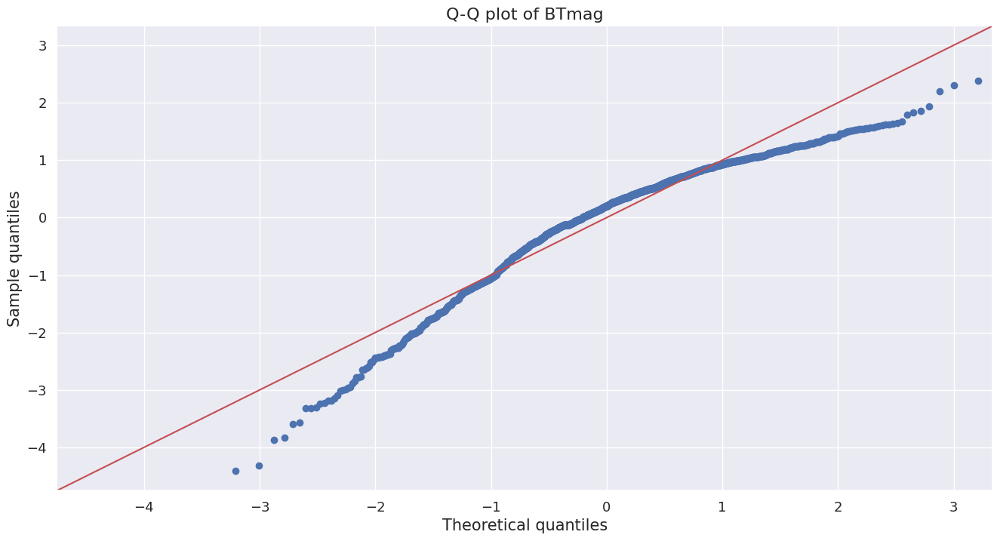

<Figure size 800x500 with 0 Axes>

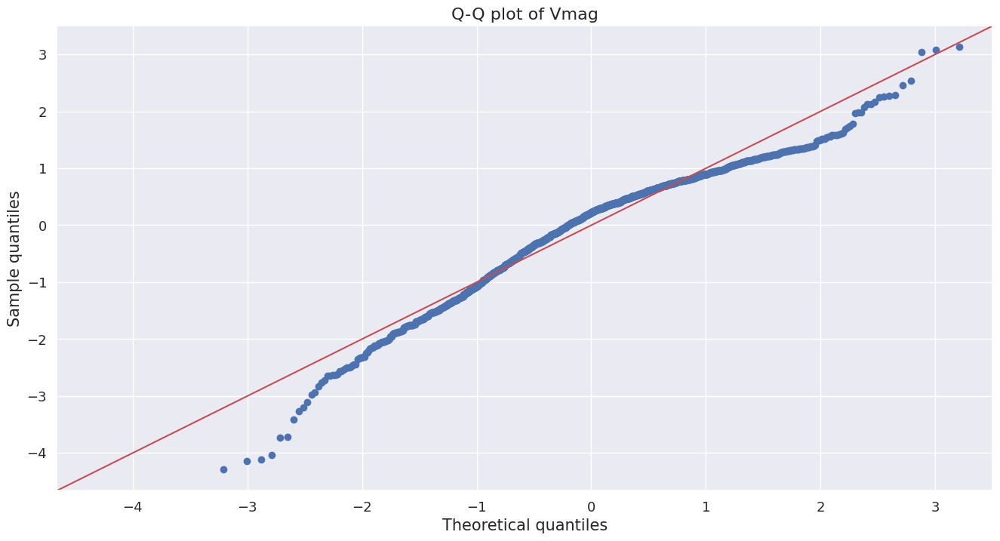

<Figure size 800x500 with 0 Axes>

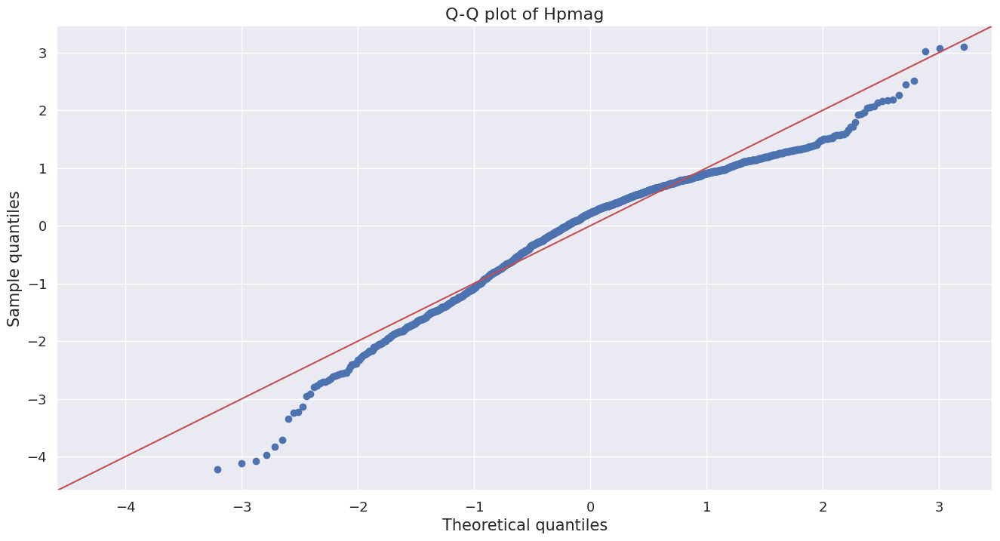

<Figure size 800x500 with 0 Axes>

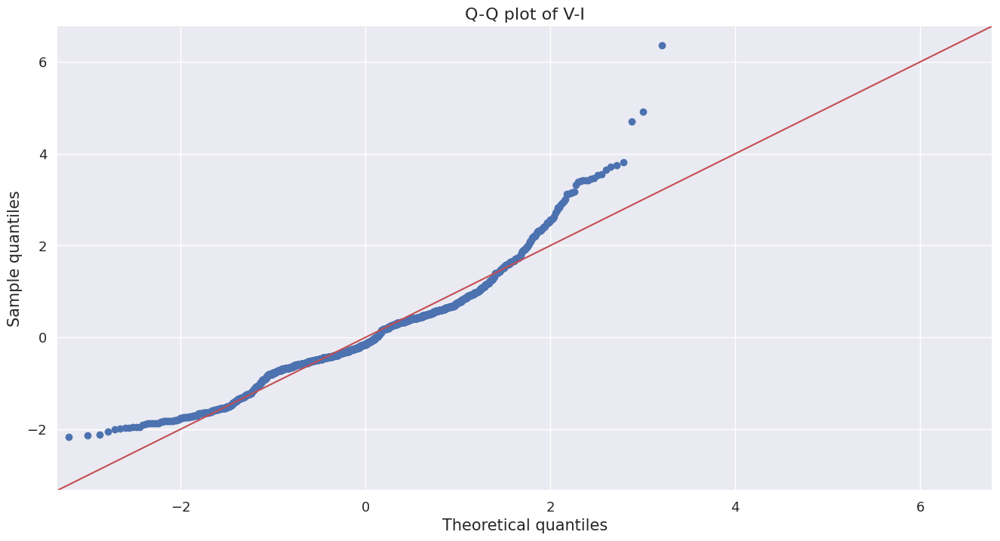

In [91]:
# checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot

data_norm = data[
    [
 'BTmag',
 'Vmag',
 'Hpmag',
  'V-I'
    ]
]
for c in data_norm.columns[:]:
    plt.figure(figsize=(8, 5))
    fig = qqplot(data_norm[c], line="45", fit="True")
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.xlabel("Theoretical quantiles", fontsize=15)
    plt.ylabel("Sample quantiles", fontsize=15)
    plt.title("Q-Q plot of {}".format(c), fontsize=16)
    plt.grid(True)
    plt.show()

1.	Looking at the Q-Q plot above, it appears that all independent variables are roughly following normal distribution
2.	There are few outliers in few of the predictor variables like in Height, Viscera height and Shucked weight


<Axes: >

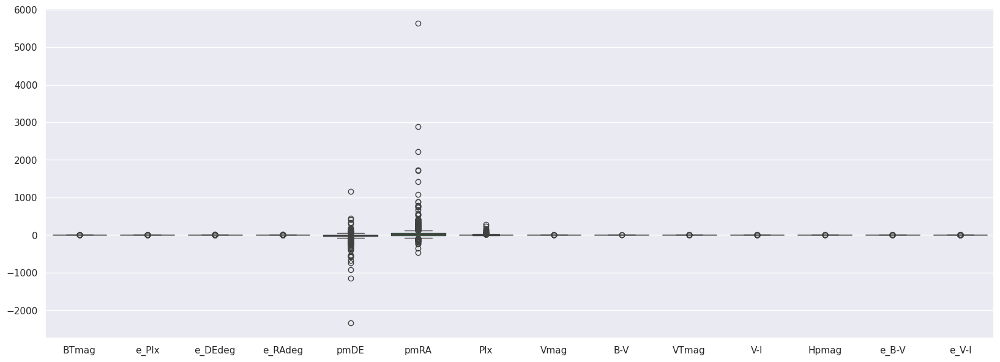

In [22]:
# Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20, 7))
sns.boxplot(data=data)

It is hard to visualize and read data as they are not in same ranges, I'll try to normalize the data for a better understanding and visualization. It will also help later to get normalized coeffiecients when building the Model.

In [92]:

def outlier_treatment(data):
    # Identify numeric columns
    numeric_columns = data.select_dtypes(include=[np.number]).columns

    # Loop through each numeric column
    for column in numeric_columns:
        # Calculate the z-score for each data point in the column
        z_scores = (data[column] - data[column].mean()) / data[column].std()

        # Define the threshold for outliers
        threshold = 3

        # Identify outlier indices
        outlier_indices = np.abs(z_scores) > threshold

        # Replace outlier values with the median
        data.loc[outlier_indices, column] = data[column].median()

    return data

data = outlier_treatment(data)


<Axes: >

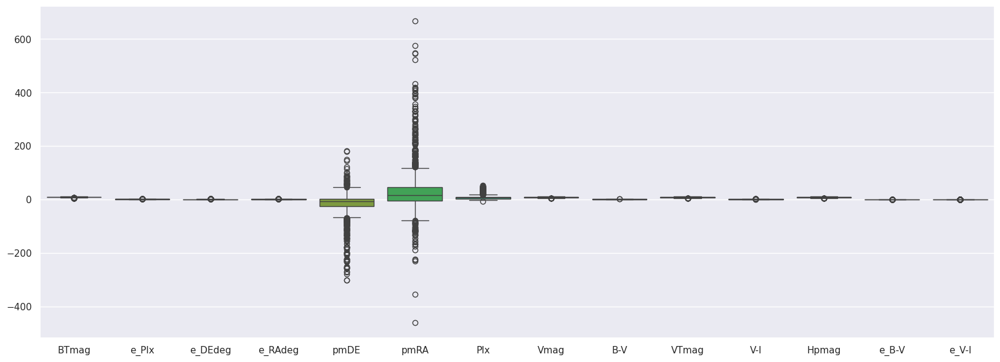

In [24]:
# Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20, 7))
sns.boxplot(data=data)

## Data transforming, Feature creation and Analysis

### Numeric Data Types

In [93]:
numerical_data = data.select_dtypes(["float64","int64"]).columns.tolist()
numerical_data

['BTmag',
 'e_Plx',
 'e_DEdeg',
 'e_RAdeg',
 'pmDE',
 'pmRA',
 'Plx',
 'Vmag',
 'B-V',
 'VTmag',
 'V-I',
 'Hpmag',
 'e_B-V',
 'e_V-I']

###Likely distributions of the numeric variables

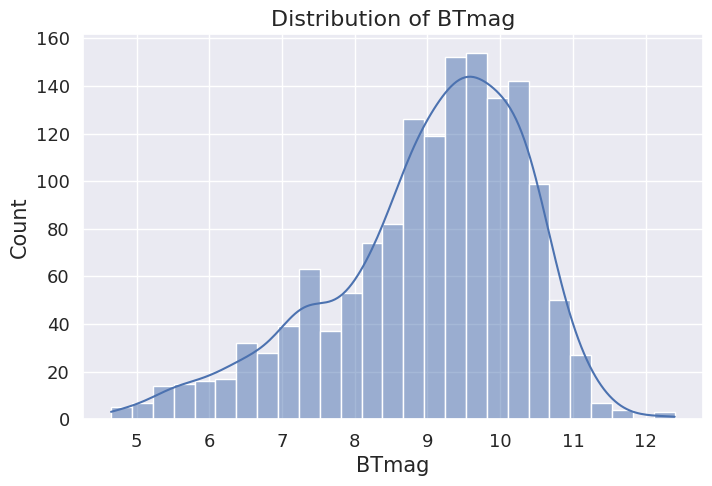

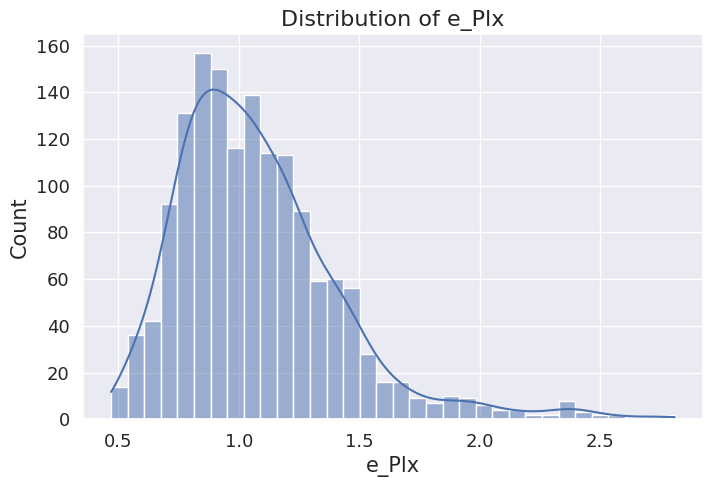

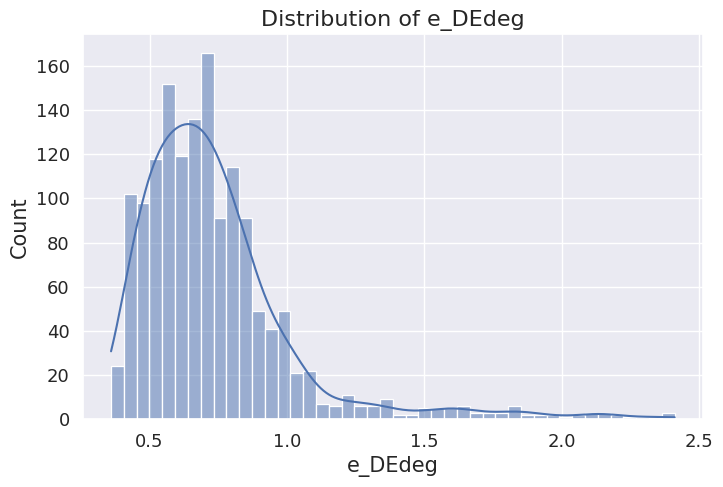

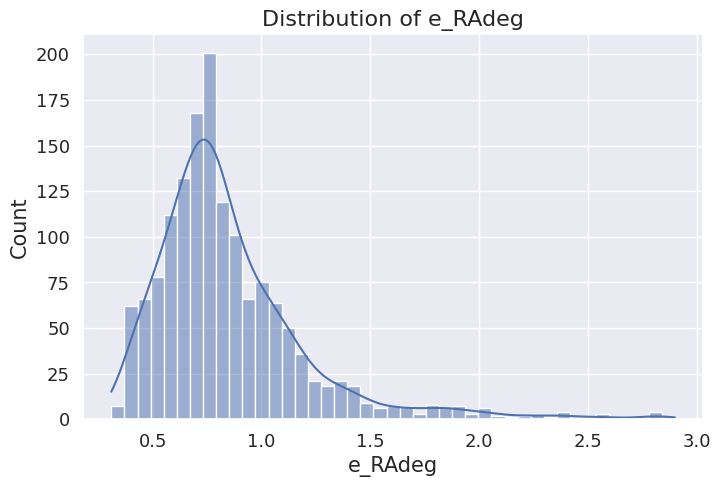

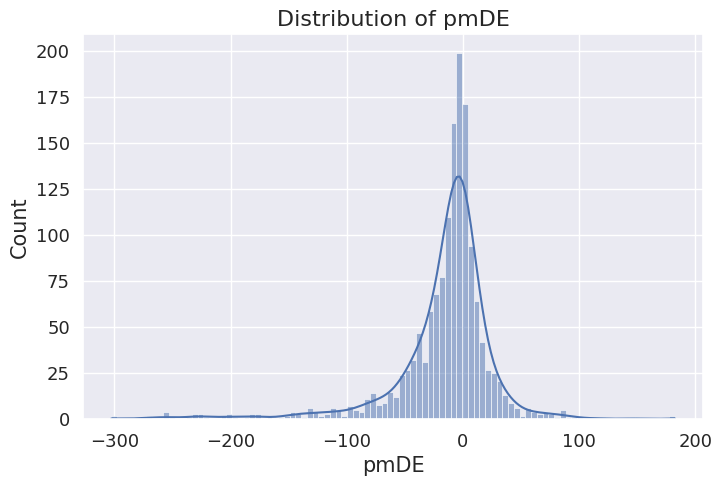

...

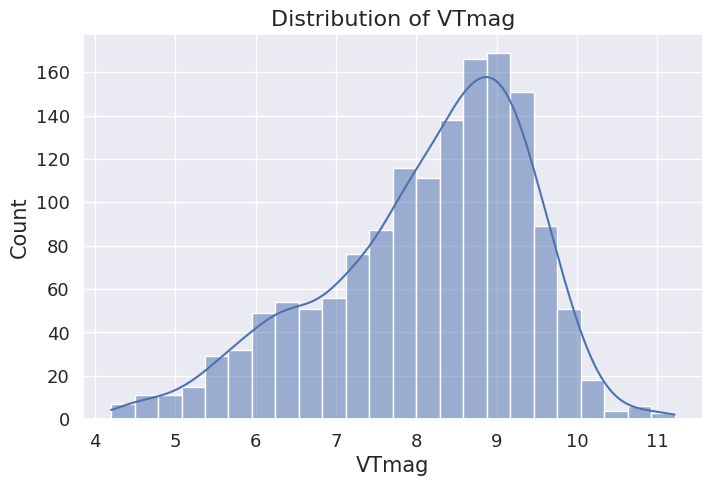

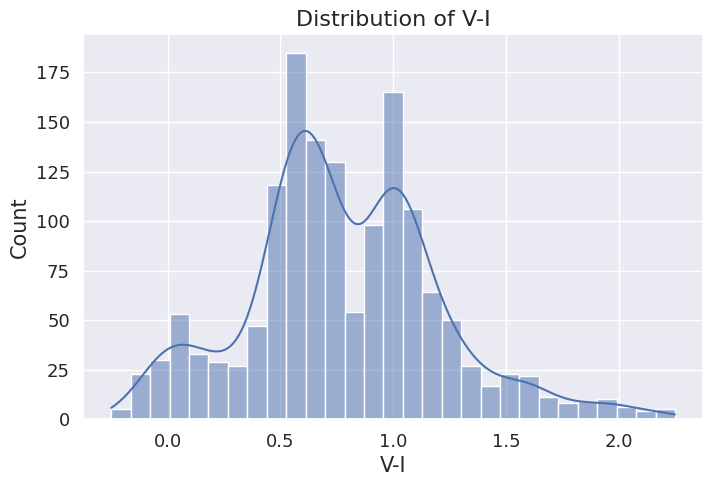

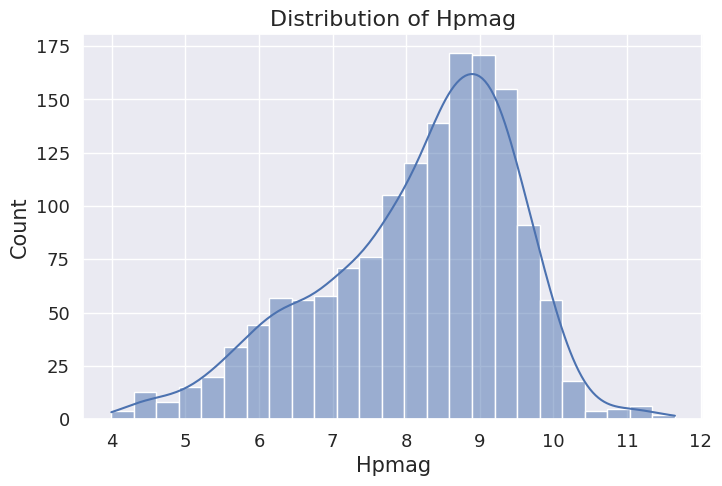

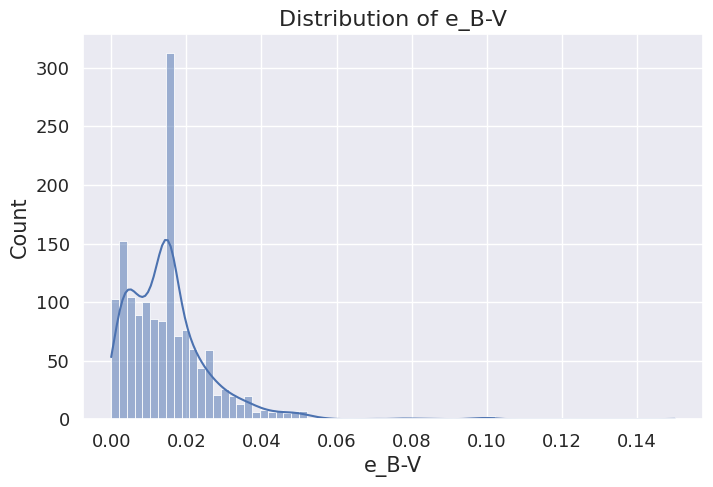

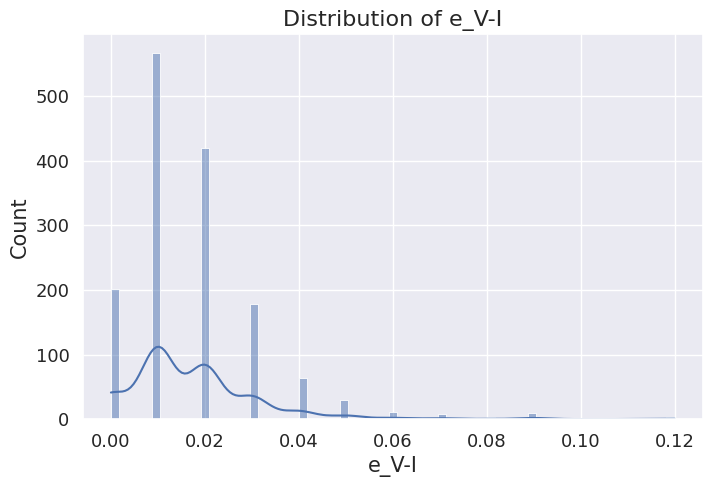

In [26]:


for c in numerical_data[:]:
    plt.figure(figsize=(8, 5))
    sns.histplot(data=data, x=c, kde=True)
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.xlabel(c, fontsize=15)
    plt.ylabel("Count", fontsize=15)
    plt.title("Distribution of {}".format(c), fontsize=16)
    plt.grid(True)
    plt.show()


### Normalization


In [94]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

data[numerical_data] = scaler.fit_transform(data[numerical_data])


In [95]:
data.head()

,BTmag,e_Plx,e_DEdeg,e_RAdeg,pmDE,pmRA,Plx,Vmag,B-V,VTmag,V-I,Hpmag,e_B-V,e_V-I,r_Vmag,r_SpType,SpType
1,0.757353,0.239316,0.165854,0.374517,0.621887,0.569165,0.480589,0.702738,0.542619,0.737997,0.516,0.706247,0.013333,0.000000,G,4,Dwarf
3,0.493163,0.213675,0.112195,0.084942,0.624134,0.464279,0.243809,0.544980,0.266257,0.554780,0.272,0.542731,0.060000,0.083333,H,2,Dwarf
4,0.650800,0.273504,0.121951,0.127413,0.642501,0.410825,0.162149,0.608866,0.500000,0.635133,0.460,0.615601,0.086667,0.083333,H,2,Giant
5,0.533250,0.239316,0.887805,0.181467,0.597337,0.609113,0.428715,0.581486,0.690685,0.538222,0.720,0.581288,0.133333,0.250000,G,S,Dwarf
9,0.579463,0.269231,0.180488,0.177606,0.706299,0.446006,0.294177,0.614081,0.318541,0.631429,0.324,0.614517,0.073333,0.083333,H,2,Dwarf


Label Encoder


In [96]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

for column in categorical_data:
    data[column] = le.fit_transform(data[column])


In [35]:
data.head()

,BTmag,e_Plx,e_DEdeg,e_RAdeg,pmDE,pmRA,Plx,Vmag,B-V,VTmag,V-I,Hpmag,e_B-V,e_V-I,r_Vmag,r_SpType,SpType
1,0.757353,0.239316,0.165854,0.374517,0.621887,0.569165,0.480589,0.702738,0.542619,0.737997,0.516,0.706247,0.013333,0.000000,0,3,0
3,0.493163,0.213675,0.112195,0.084942,0.624134,0.464279,0.243809,0.544980,0.266257,0.554780,0.272,0.542731,0.060000,0.083333,1,1,0
4,0.650800,0.273504,0.121951,0.127413,0.642501,0.410825,0.162149,0.608866,0.500000,0.635133,0.460,0.615601,0.086667,0.083333,1,1,1
5,0.533250,0.239316,0.887805,0.181467,0.597337,0.609113,0.428715,0.581486,0.690685,0.538222,0.720,0.581288,0.133333,0.250000,0,6,0
9,0.579463,0.269231,0.180488,0.177606,0.706299,0.446006,0.294177,0.614081,0.318541,0.631429,0.324,0.614517,0.073333,0.083333,1,1,0


<Axes: >

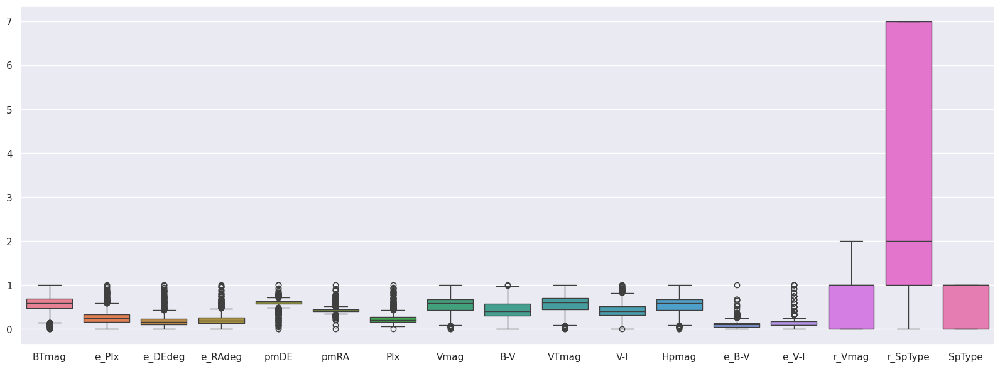

In [31]:
# Checking the Ranges of the predictor variables and dependent variable after normalizing
plt.figure(figsize=(20, 7))
sns.boxplot(data=data)

## Remove outliers and keep outliers (does if have an effect of the final predictive model)?

In [97]:
# prompt: Give me outlier treatment

def outlier_treatment(data):
  for col in data.select_dtypes(include=["float64", "int64"]):
    IQR = data[col].quantile(0.75) - data[col].quantile(0.25)
    lower_bound = data[col].quantile(0.25) - 1.5 * IQR
    upper_bound = data[col].quantile(0.75) + 1.5 * IQR
    data[col] = np.clip(data[col], lower_bound, upper_bound)
  return data

data = outlier_treatment(data)


<Axes: >

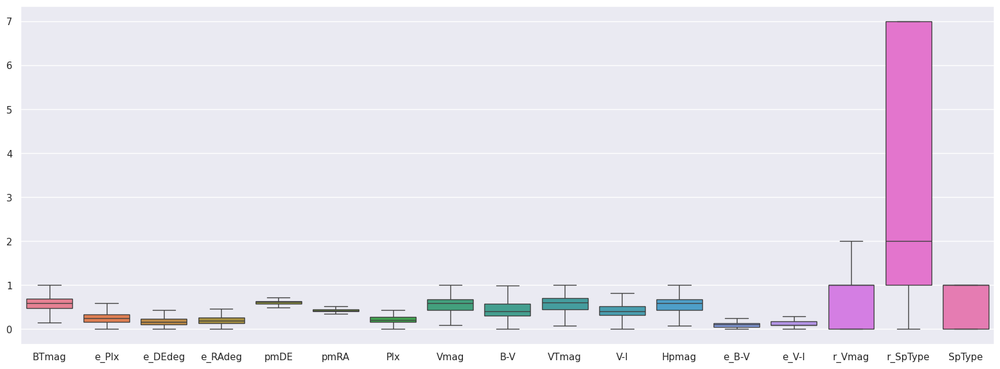

In [33]:
# Checking the Ranges of the predictor variables and dependent variable after normalizing
plt.figure(figsize=(20, 7))
sns.boxplot(data=data)

Now it is clear to visualize and interpret the data. Looking at the boxplot above, we can infer.

###Independent variables are useful to predict a target
Method 1: Corr Matrix

In [34]:
# checking the correlation between all the features in the data
data.corr()

,BTmag,e_Plx,e_DEdeg,e_RAdeg,pmDE,pmRA,Plx,Vmag,B-V,VTmag,V-I,Hpmag,e_B-V,e_V-I,r_Vmag,r_SpType,SpType
BTmag,1.000000,0.605309,0.570030,0.460025,0.053800,-0.070306,-0.293235,0.851545,0.344925,0.888215,0.359655,0.859761,0.584549,0.356388,0.061678,-0.425155,-0.042289
e_Plx,0.605309,1.000000,0.802380,0.834144,-0.049890,-0.014690,-0.094935,0.672073,-0.024210,0.672596,0.007061,0.671830,0.402648,0.204563,-0.086033,-0.191355,-0.273418
e_DEdeg,0.570030,0.802380,1.000000,0.750301,0.010282,0.003752,-0.079209,0.636576,-0.019948,0.632049,0.020069,0.636676,0.414227,0.215816,-0.079705,-0.246139,-0.247393
e_RAdeg,0.460025,0.834144,0.750301,1.000000,-0.055235,0.011225,-0.018778,0.510459,-0.031013,0.511197,-0.004023,0.510474,0.344824,0.201739,-0.115991,-0.111654,-0.258150
pmDE,0.053800,-0.049890,0.010282,-0.055235,1.000000,0.105880,-0.239313,0.039401,-0.019578,0.049605,-0.038445,0.036788,0.046124,0.048742,0.022300,-0.071187,0.095728
pmRA,-0.070306,-0.014690,0.003752,0.011225,0.105880,1.000000,0.286632,-0.055869,-0.002619,-0.056982,0.019229,-0.053390,-0.108369,-0.088924,-0.076434,-0.011499,-0.093632
Plx,-0.293235,-0.094935,-0.079209,-0.018778,-0.239313,0.286632,1.000000,-0.204169,-0.211818,-0.210399,-0.164091,-0.202108,-0.255454,-0.228891,-0.191105,0.083292,-0.415097
Vmag,0.851545,0.672073,0.636576,0.510459,0.039401,-0.055869,-0.204169,1.000000,-0.011094,0.971864,0.032436,0.999255,0.496423,0.193140,-0.014297,-0.422811,-0.289907
B-V,0.344925,-0.024210,-0.019948,-0.031013,-0.019578,-0.002619,-0.211818,-0.011094,1.000000,0.002912,0.961776,0.010150,0.268337,0.359885,0.204619,-0.078267,0.542895
VTmag,0.888215,0.672596,0.632049,0.511197,0.049605,-0.056982,-0.210399,0.971864,0.002912,1.000000,0.038150,0.972281,0.517072,0.209902,-0.018811,-0.432128,-0.273803


<Axes: >

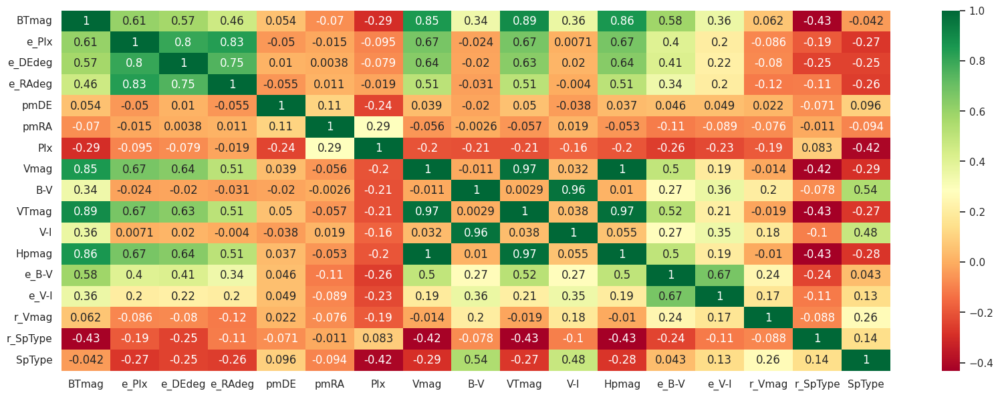

In [35]:
# the heat map of the correlation
plt.figure(figsize=(20, 7))
sns.heatmap(data.corr(), annot=True, cmap="RdYlGn")

We can see there are lot of co-relation among the variables. The co-relation between B-V and SrType being the highest, it may mean that essentially both predicting same thing

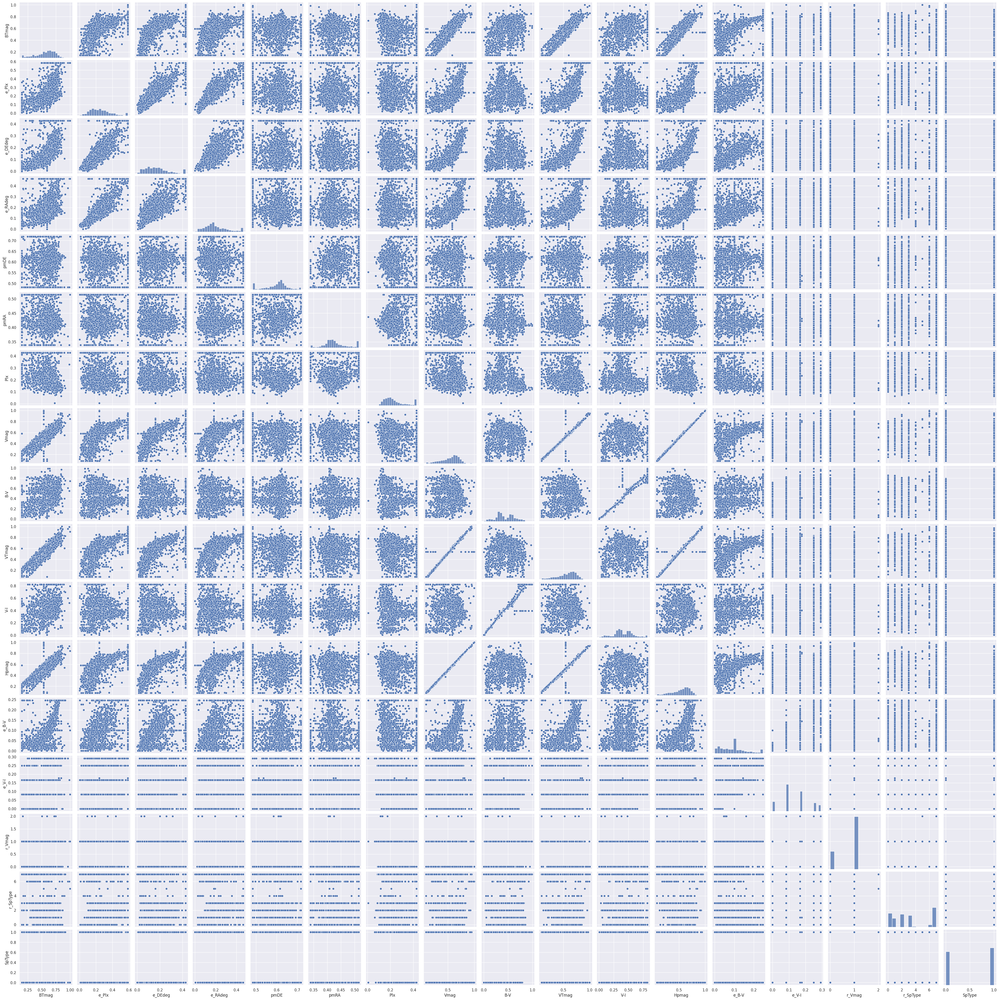

In [36]:
# pair plot to check the colinearity
sns.pairplot(data)

Correlation matrix and heatmap shows that there is multicollinearity between the independent variables. Heighest correlation is between SpType and B-V.

### Method 2

In [98]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
X = data.iloc[:,0:8]
y = data.iloc[:,-1]
y=y.astype('int')
# y = pd.DataFrame(y)
y.head(10)
y.describe()

count    1500.000000
mean        0.527333
std         0.499419
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: SpType, dtype: float64

In [99]:
from sklearn.ensemble import ExtraTreesClassifier

model = ExtraTreesClassifier()
model.fit(X,y)

ExtraTreesClassifier()

In [100]:
print(model.feature_importances_)

[0.13842907 0.09776305 0.09422759 0.09344131 0.08708332 0.09180509
 0.2354956  0.16175495]


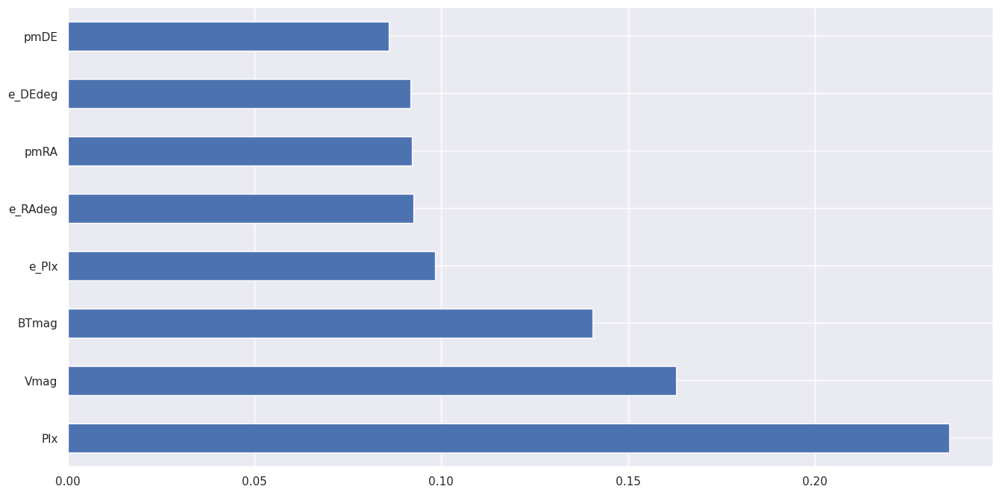

In [40]:
#Plot graph of feature importance for better visualization
feat_importances = pd.Series(model.feature_importances_,index = X.columns)
feat_importances.nlargest(10).plot(kind = 'barh')
plt.show()

Method 3: Univariate

In [101]:
#Applying SelectKBest class to extract top features
bestFeatures = SelectKBest(score_func= chi2, k = 8)
fit = bestFeatures.fit(X,y)

In [102]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# define the model
model = SelectKBest(score_func=chi2, k=8)

# fit the model
model.fit(X, y)

# summarize the scores
for i in range(len(X.columns)):
	print('Feature %s: %f' % (X.columns[i], model.scores_[i]))

# summarize the selected features
print('Selected Features:')
for i in model.get_support(indices=True):
	print(X.columns[i])


Feature BTmag: 0.135880
Feature e_Plx: 7.393095
Feature e_DEdeg: 5.747519
Feature e_RAdeg: 5.838598
Feature pmDE: 0.071735
Feature pmRA: 0.053620
Feature Plx: 8.869989
Feature Vmag: 6.738765
Selected Features:
BTmag
e_Plx
e_DEdeg
e_RAdeg
pmDE
pmRA
Plx
Vmag


In [103]:
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

In [104]:
#Conact two dataframes for better visualization
featureScores = pd.concat([dfcolumns,dfscores], axis = 1)
featureScores.columns = ['Specs','Score']
featureScores

,Specs,Score
0,BTmag,0.135880
1,e_Plx,7.393095
2,e_DEdeg,5.747519
3,e_RAdeg,5.838598
4,pmDE,0.071735
5,pmRA,0.053620
6,Plx,8.869989
7,Vmag,6.738765


In [105]:
#Ordering methods from highest importance to lowest
print(featureScores.nlargest(10,'Score'))

     Specs     Score
6      Plx  8.869989
1    e_Plx  7.393095
7     Vmag  6.738765
3  e_RAdeg  5.838598
2  e_DEdeg  5.747519
0    BTmag  0.135880
4     pmDE  0.071735
5     pmRA  0.053620


### Identifing predictor significance

Is the predictor variables independent of all the other predictor variables?

In [106]:
# Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(
    data["SpType"],
    data[
        [
            'BTmag', 'e_Plx', 'e_DEdeg', 'e_RAdeg', 'pmDE', 'pmRA', 'Plx', 'Vmag',
       'B-V', 'VTmag', 'V-I', 'Hpmag', 'e_B-V', 'e_V-I', 'r_Vmag', 'r_SpType',
        ]
    ],
).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                 SpType   R-squared (uncentered):                   0.786
Model:                            OLS   Adj. R-squared (uncentered):              0.784
Method:                 Least Squares   F-statistic:                              341.1
Date:                Wed, 03 Apr 2024   Prob (F-statistic):                        0.00
Time:                        01:22:42   Log-Likelihood:                         -491.34
No. Observations:                1500   AIC:                                      1015.
Df Residuals:                    1484   BIC:                                      1100.
Df Model:                          16                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
BTmag          0.0236      0.174      0.135      0.892      -0.318       0.366
e_Plx         -0.2393      0.153     -1.564      0.118      -0.539       0.061
e_DEdeg        0.0854      0.151      0.564      0.573      -0.212       0.383
e_RAdeg       -0.2536      0.155     -1.640      0.101      -0.557       0.050
pmDE           0.9402      0.127      7.388      0.000       0.691       1.190
pmRA           0.7154      0.197      3.630      0.000       0.329       1.102
Plx           -1.9394      0.112    -17.254      0.000      -2.160      -1.719
Vmag         -12.1481      1.722     -7.055      0.000     -15.526      -8.770
B-V            1.7017      0.182      9.363      0.000       1.345       2.058
VTmag         -0.2075      0.264     -0.785      0.433      -0.726       0.311
V-I           -0.8287      0.206     -4.025      0.000      -1.233      -0.425
Hpmag         11.6297      1.731      6.718      0.000       8.234      15.026
e_B-V          0.2123      0.230      0.921      0.357      -0.240       0.664
e_V-I         -0.2417      0.149     -1.618      0.106      -0.535       0.051
r_Vmag         0.1224      0.021      5.784      0.000       0.081       0.164
r_SpType       0.0251      0.004      6.955      0.000       0.018       0.032
==============================================================================
Omnibus:                       80.913   Durbin-Watson:                   1.989
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              101.493
Skew:                           0.524   Prob(JB):                     9.14e-23
Kurtosis:                       3.726   Cond. No.                     1.22e+03
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 1.22e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<br>HIP: HIP number (likely categorical or identifier)
<br>RAhms: Right Ascension in hours, minutes, seconds (likely numeric)
<br>BTmag: Tycho B_T magnitude (likely numeric)
<br>e_Plx: Standard error of Plx (likely numeric)
<br>e_DEdeg: Standard error of DEdeg (likely numeric)
<br>e_RAdeg: Standard error of RAdeg (likely numeric)
<br>pmDE: Proper motion in DE (likely numeric)
<br>pmRA: Proper motion in RA (likely numeric)
<br>Plx: Parallax (likely numeric)
<br>Vmag: Visual magnitude (likely numeric)
<br>SpType: Spectral type (target variable, categorical)

## Building the Model

###Train ,Validation and Test split

In [107]:
from sklearn.model_selection import train_test_split

X = data[
    [
        'BTmag', 'e_Plx', 'e_DEdeg', 'e_RAdeg', 'pmDE', 'pmRA', 'Plx', 'Vmag',
       'B-V', 'VTmag', 'V-I', 'Hpmag', 'e_B-V', 'e_V-I', 'r_Vmag', 'r_SpType'
    ]
]

y = data["SpType"]

# Spliting data into Training 76.5%, Validation set 13.5% and Test set 10%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(
    X_t, y_t, test_size=0.15, random_state=1
)

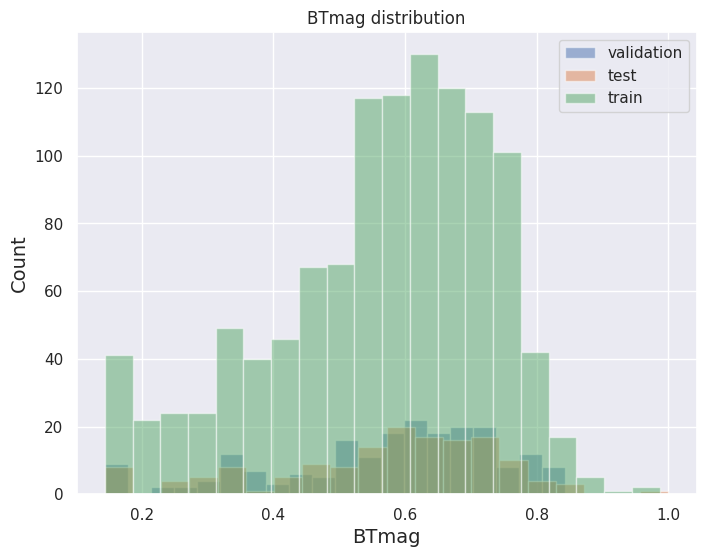

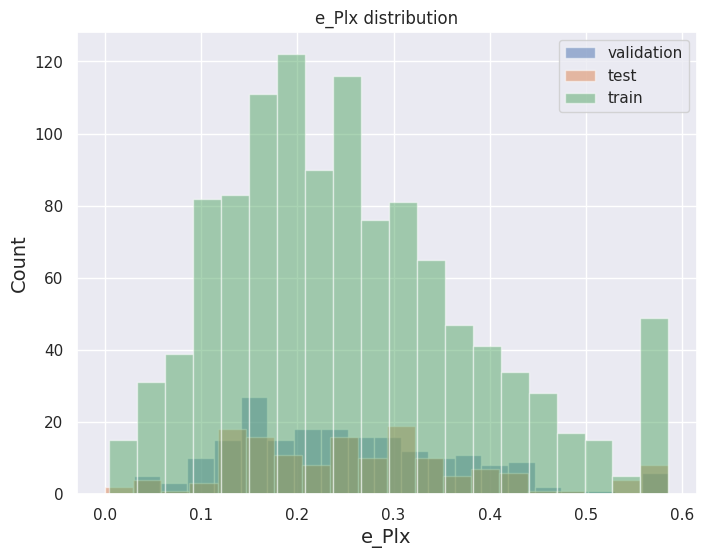

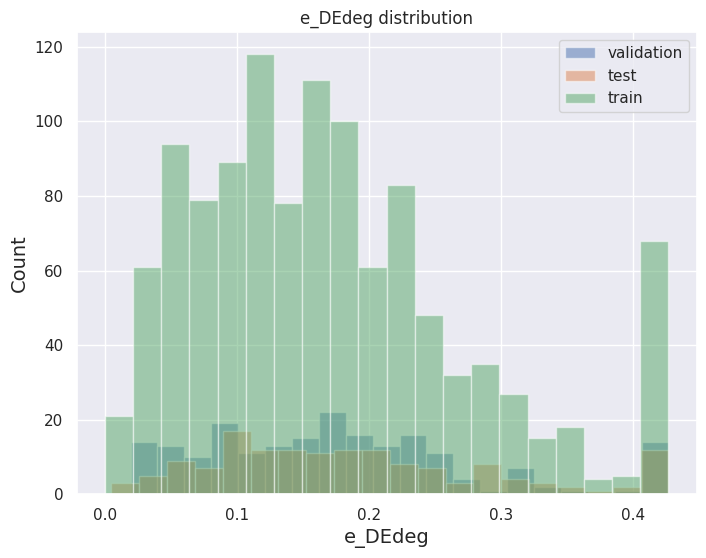

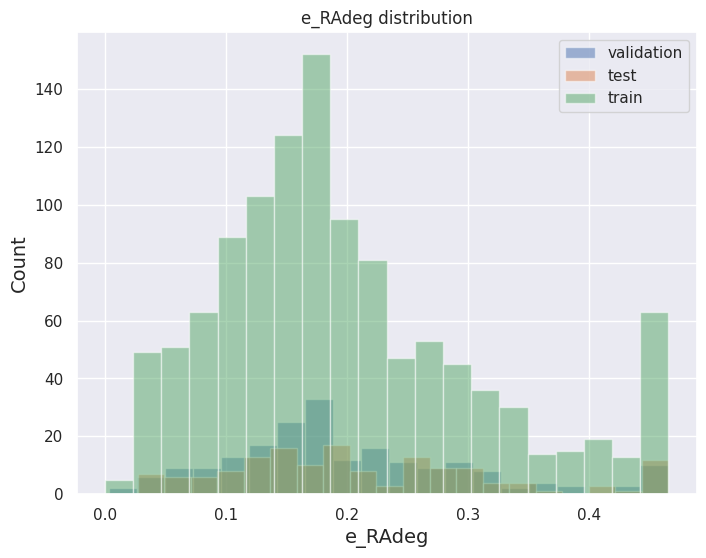

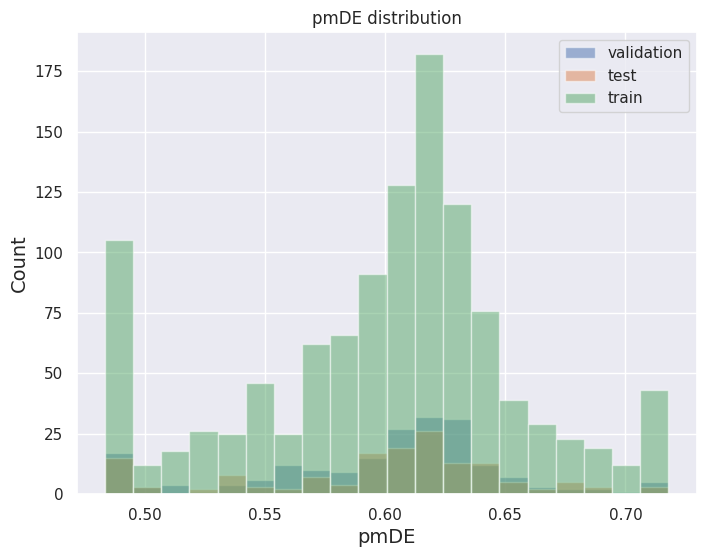

...

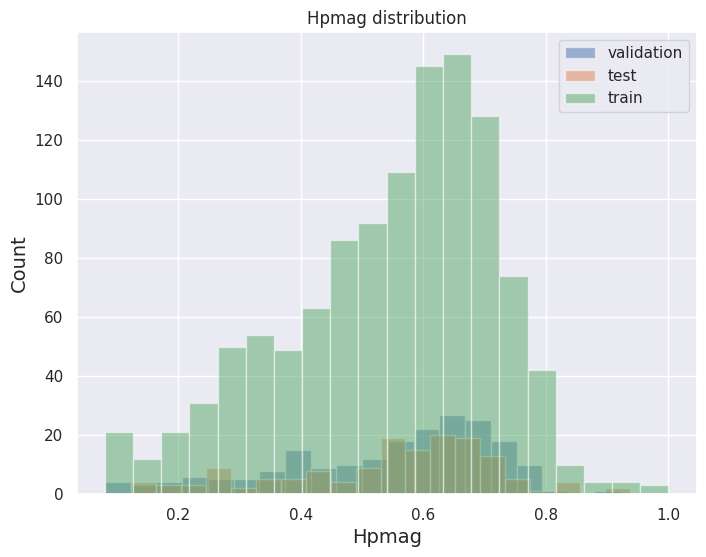

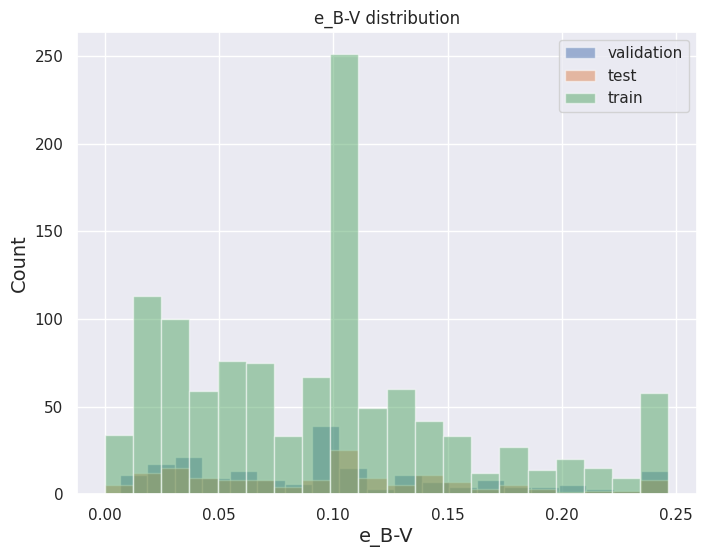

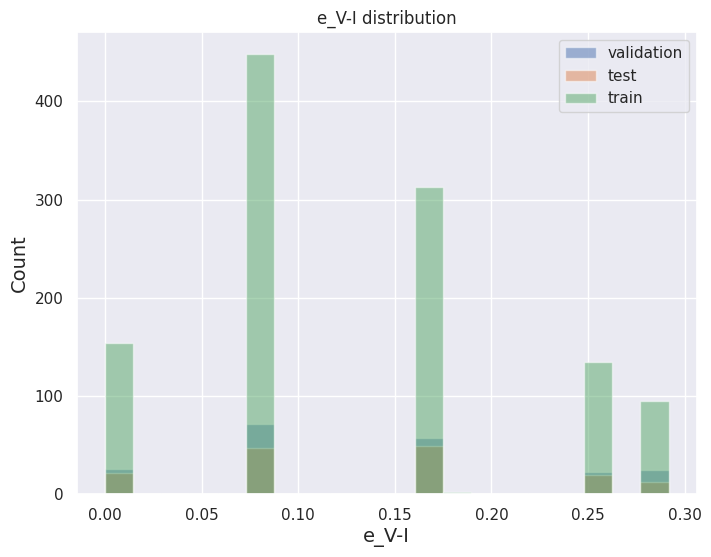

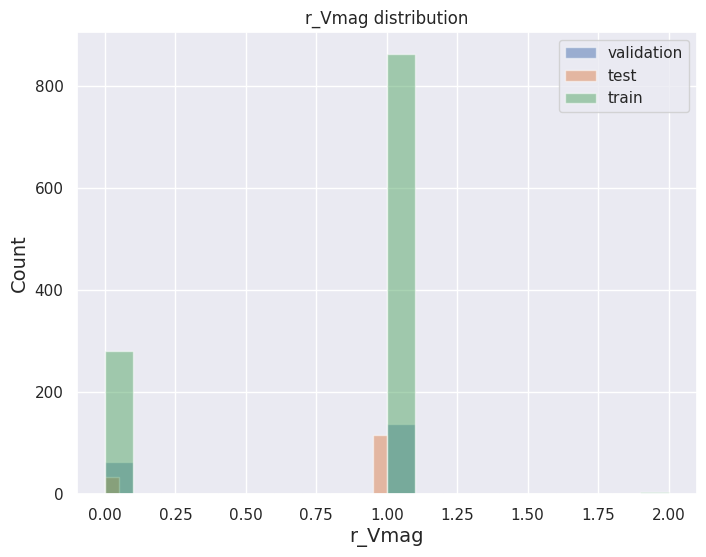

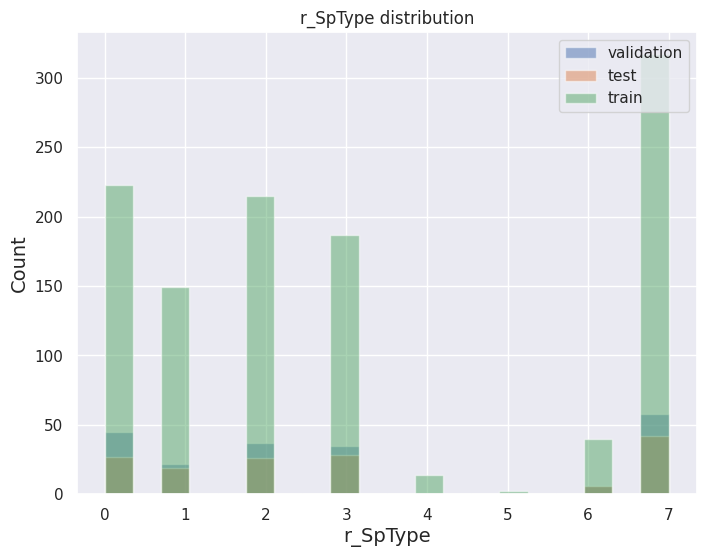

In [108]:
# Looking the data for test, training and validation set
X_test_plot = X_test[
    [
        'BTmag', 'e_Plx', 'e_DEdeg', 'e_RAdeg', 'pmDE', 'pmRA', 'Plx', 'Vmag',
       'B-V', 'VTmag', 'V-I', 'Hpmag', 'e_B-V', 'e_V-I', 'r_Vmag', 'r_SpType'
    ]
]

X_val_plot = X_val[
    [
        'BTmag', 'e_Plx', 'e_DEdeg', 'e_RAdeg', 'pmDE', 'pmRA', 'Plx', 'Vmag',
       'B-V', 'VTmag', 'V-I', 'Hpmag', 'e_B-V', 'e_V-I', 'r_Vmag', 'r_SpType'
    ]
]

X_train_plot = X_train[
    [
        'BTmag', 'e_Plx', 'e_DEdeg', 'e_RAdeg', 'pmDE', 'pmRA', 'Plx', 'Vmag',
       'B-V', 'VTmag', 'V-I', 'Hpmag', 'e_B-V', 'e_V-I', 'r_Vmag', 'r_SpType'
    ]
]

# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
    plt.figure(figsize=(8, 6))
    plt.hist(X_val_plot[c], bins=20, alpha=0.5, label="validation")
    plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
    plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
    plt.xlabel(c, size=14)
    plt.ylabel("Count", size=14)
    plt.legend(loc="upper right")
    plt.title("{} distribution".format(c))
    plt.show()

1. The division of dataset in Test, train and validation sets looks fine except few boundary values of Length', 'Diameter', 'Height', 'Whole weight', 'Shucked weight', 'Viscera weight', 'Shell weight' which appears to be missing in test and validation sets

### Logistic Regression

In [109]:
from sklearn.linear_model import LogisticRegression
from sklearn import datasets, linear_model

In [110]:
# Create linear regression object
regr = linear_model.LogisticRegression()

# Train the model using the training sets
regr.fit(X_train, y_train)

LogisticRegression()

#### Marking predictions

In [111]:
from sklearn.metrics import classification_report
y_pred = regr.predict(X_train)
print(classification_report(y_train, y_pred))


              precision    recall  f1-score   support

           0       0.86      0.91      0.88       557
           1       0.91      0.86      0.88       590

    accuracy                           0.88      1147
   macro avg       0.88      0.88      0.88      1147
weighted avg       0.88      0.88      0.88      1147



In [112]:
from sklearn.metrics import classification_report
y_pred = regr.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.77      0.90      0.83        62
           1       0.92      0.81      0.86        88

    accuracy                           0.85       150
   macro avg       0.84      0.86      0.85       150
weighted avg       0.86      0.85      0.85       150



In [113]:
from sklearn.metrics import accuracy_score, confusion_matrix
accuracy_score(y_test,y_pred)*100

84.66666666666667

In [114]:
from sklearn.metrics import classification_report
y_pred = regr.predict(X_val)
print(classification_report(y_val, y_pred))


              precision    recall  f1-score   support

           0       0.85      0.88      0.86        90
           1       0.90      0.88      0.89       113

    accuracy                           0.88       203
   macro avg       0.87      0.88      0.88       203
weighted avg       0.88      0.88      0.88       203



In [115]:
accuracy_score(y_val, y_pred)*100

87.68472906403942

## Understanding the important features

In [56]:
# Understanding the important features
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(regr, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names=X_test.columns.tolist())

Weight,Feature
0.1573 ± 0.0728,B-V
0.0747 ± 0.0320,Plx
0.0240 ± 0.0287,r_Vmag
0.0160 ± 0.0181,V-I
0.0107 ± 0.0392,Vmag
0.0093 ± 0.0247,r_SpType
0.0093 ± 0.0200,VTmag
0.0093 ± 0.0065,e_DEdeg
0.0080 ± 0.0259,e_Plx
0.0067 ± 0.0084,e_RAdeg


###Result Comparision

In [116]:
# prompt: mean_absolute_error, mean_squared_error, r2_score

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
y_pred = regr.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Mean absolute error: %.2f" % mae)
print("Mean squared error: %.2f" % mse)
print("R^2 score: %.2f" % r2)


Mean absolute error: 0.15
Mean squared error: 0.15
R^2 score: 0.37


###Data Imputation

In [117]:
df_imputation= data[['SpType']]
df_imputation['1_percent'] = df_imputation[['SpType']]
df_imputation['5_percent'] = df_imputation[['SpType']]
df_imputation['10_percent'] = df_imputation[['SpType']]
df_imputation.head()

<ipython-input-117-8d756334096c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_imputation['1_percent'] = df_imputation[['SpType']]
<ipython-input-117-8d756334096c>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_imputation['5_percent'] = df_imputation[['SpType']]
<ipython-input-117-8d756334096c>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

,SpType,1_percent,5_percent,10_percent
1,0,0,0,0
3,0,0,0,0
4,1,1,1,1
5,0,0,0,0
9,0,0,0,0


In [59]:
def get_percent_missing(dataframe):

    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame({'column_name': dataframe.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df

In [60]:
print(get_percent_missing(df_imputation))


           column_name  percent_missing
SpType          SpType              0.0
1_percent    1_percent              0.0
5_percent    5_percent              0.0
10_percent  10_percent              0.0


In [61]:
def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac = percent).index, col] = np.nan


In [62]:
create_missing(df_imputation, 0.01, '1_percent')
create_missing(df_imputation, 0.05, '5_percent')
create_missing(df_imputation, 0.1, '10_percent')

In [63]:
print(get_percent_missing(df_imputation))

           column_name  percent_missing
SpType          SpType              0.0
1_percent    1_percent              1.0
5_percent    5_percent              5.0
10_percent  10_percent             10.0


In [64]:
# Store Index of NaN values in each coloumns
number_1_idx = list(np.where(df_imputation['1_percent'].isna())[0])
number_5_idx = list(np.where(df_imputation['5_percent'].isna())[0])
number_10_idx = list(np.where(df_imputation['10_percent'].isna())[0])

In [65]:
print(f"Length of number_1_idx is {len(number_1_idx)} and it contains {(len(number_1_idx)/len(df_imputation['1_percent']))*100}% of total data in column | Total rows: {len(df_imputation['1_percent'])}")
print(f"Length of number_5_idx is {len(number_5_idx)} and it contains {(len(number_5_idx)/len(df_imputation['5_percent']))*100}% of total data in column | Total rows: {len(df_imputation['5_percent'])}")
print(f"Length of number_10_idx is {len(number_10_idx)} and it contains {(len(number_10_idx)/len(df_imputation['10_percent']))*100}% of total data in column | Total rows: {len(df_imputation['10_percent'])}")

Length of number_1_idx is 15 and it contains 1.0% of total data in column | Total rows: 1500
Length of number_5_idx is 75 and it contains 5.0% of total data in column | Total rows: 1500
Length of number_10_idx is 150 and it contains 10.0% of total data in column | Total rows: 1500


###KNN implementation


The k nearest neighbours is an algorithm that is used for simple classification. The algorithm uses ‘feature similarity’ to predict the values of any new data points. This means that the new point is assigned a value based on how closely it resembles the points in the training set.


In [66]:
#Creating a seperate dataframe for performing the KNN imputation
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler
df_imputation1 = df_imputation[['1_percent','5_percent','10_percent']]
imputer = KNNImputer(n_neighbors=5)
imputed_number_df = pd.DataFrame(imputer.fit_transform(df_imputation1), columns = df_imputation1.columns)

In [67]:
imputed_number_df.head()


,1_percent,5_percent,10_percent
0,0.0,0.0,0.0
1,0.0,0.0,0.0
2,1.0,1.0,1.0
3,0.0,0.0,0.0
4,0.0,0.0,0.0


In [68]:
print(get_percent_missing(imputed_number_df))


           column_name  percent_missing
1_percent    1_percent              0.0
5_percent    5_percent              0.0
10_percent  10_percent              0.0


In [69]:
SpType = data["SpType"]
imputed_mean = pd.concat([SpType,imputed_number_df])
imputed_mean.columns = ["SpType","1_Percent","5_Percent","10_Percent"]
imputed_mean.var()

SpType        0.249419
1_Percent     0.249419
5_Percent     0.249419
10_Percent    0.249419
dtype: float64

### Mean based Imputation with Simpleimputer
This works by calculating the mean/median of the non-missing values in a column and then replacing the missing values within each column separately and independently from the others. It can only be used with numeric data.

In [70]:
df_imputation_mean = df_imputation[['1_percent','5_percent','10_percent']]

In [71]:
from sklearn.impute import SimpleImputer
imp_mean = SimpleImputer( strategy='mean') #for median imputation replace 'mean' with 'median'
imp_mean.fit(df_imputation_mean)
imputed_train_df = imp_mean.transform(df_imputation_mean)

In [72]:
imputed_mean = pd.DataFrame(imp_mean.fit_transform(df_imputation_mean), columns = df_imputation_mean.columns)
print(get_percent_missing(imputed_mean))

           column_name  percent_missing
1_percent    1_percent              0.0
5_percent    5_percent              0.0
10_percent  10_percent              0.0


In [73]:
SpType = data["SpType"]
combined_mean = pd.concat([SpType,imputed_mean])
combined_mean.mean()

0             0.527333
1_percent     0.526599
5_percent     0.531228
10_percent    0.523704
dtype: float64

The Mean based method showed very negotiable variablilty. Therefore this method is acceptable for the current dataset.


### Imputation Using Multivariate Imputation by Chained Equation (MICE)
This type of imputation works by filling the missing data multiple times. Multiple Imputations (MIs) are much better than a single imputation as it measures the uncertainty of the missing values in a better way. The chained equations approach is also very flexible and can handle different variables of different data types (ie., continuous or binary) as well as complexities such as bounds or survey skip patterns.

In [74]:
df_imputation_mice = df_imputation[['1_percent','5_percent','10_percent']]
print(get_percent_missing(df_imputation_mice))

           column_name  percent_missing
1_percent    1_percent              1.0
5_percent    5_percent              5.0
10_percent  10_percent             10.0


In [75]:
pip install fancyimpute

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 5.0 MB/s eta 0:00:00
  Created wheel for fancyimpute: filename=fancyimpute-0.7.0-py3-none-any.whl size=29881 sha256=31978b5fe3e12803af69fd8d33330671f833c305a35d6ef315742deeec7f032e
  Stored in directory: /root/.cache/pip/wheels/7b/0c/d3/ee82d1fbdcc0858d96434af108608d01703505d453720c84ed
  Created wheel for knnimpute: filename=knnimpute-0.1.0-py3-none-any.whl size=11330 sha256=92f7b02fa78afd2e560de3bc72c3202f7208672f5406fb61ce38087f4a2353b5
  Stored in directory: /root/.cache/pip/wheels/46/06/a5/45a724630562413c374e29c08732411d496092408b3a7bf754
Successfully built fancyimpute knnimpute


In [76]:
import pandas as pd
from fancyimpute import IterativeImputer
mice_imputer = IterativeImputer()
imputed_training = mice_imputer.fit_transform(df_imputation_mice)

imputed_training_df = pd.DataFrame(imputed_training, columns=df_imputation_mice.columns)

In [77]:
imputed_training = pd.DataFrame(imputed_training)
imputed_training.columns = ("1_percent","5_percent","10_percent")

In [78]:
# imputed_mice = pd.DataFrame(imputed_training.fit_transform(df_imputation_mice), columns = df_imputation_mice.columns)
print(get_percent_missing(imputed_training))

           column_name  percent_missing
1_percent    1_percent              0.0
5_percent    5_percent              0.0
10_percent  10_percent              0.0


In [79]:
SpType = data["SpType"]


In [80]:
combined_mice = pd.concat([SpType,imputed_training])
combined_mice.columns = ["SpType","1_Percent","5_Percent","10_Percent"]
combined_mice.mean()

SpType        0.527333
1_Percent     0.527523
5_Percent     0.527523
10_Percent    0.527313
dtype: float64

### Accuracy  and Confusion Matrix

In [81]:
# Create a confusion matrix
confusion_matrix = pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'])

# Print the confusion matrix
print(confusion_matrix)

# Calculate the accuracy
accuracy = (confusion_matrix[0][0] + confusion_matrix[1][1]) / len(y_test)

# Print the accuracy
print(f"Accuracy: {accuracy:.2f}")


Predicted   0   1
Actual           
0          56   6
1          17  71
Accuracy: 0.85


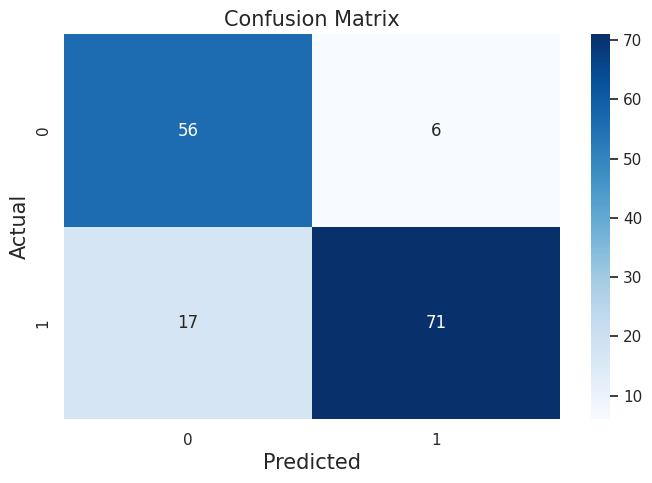

In [83]:
plt.figure(figsize=(8, 5))
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", fmt="d")
plt.xlabel("Predicted", fontsize=15)
plt.ylabel("Actual", fontsize=15)
plt.title("Confusion Matrix", fontsize=15)
plt.show()


* Do the ranges of the predictor variables make sense?

* What are the distributions of the predictor variables?   


<br>The ranges for the predictor variables you provided are typical for astrophysical measurements:

- **Plx (Parallax)**: Most important predictor. The range should be positive, with smaller values indicating stars that are farther away.

- **e_Plx (Error in Parallax)**: Second most important. Non-negative values with smaller values indicating more precise measurements.

- **Vmag (Visual Magnitude)**: Third in importance. Inverse logarithmic scale where brighter stars have lower values.

- **e_RAdeg (Error in Right Ascension)** and **e_DEdeg (Error in Declination)**: Similar importance scores. Non-negative values indicating precision in celestial position measurements.

- **BTmag (B_T Magnitude)**, **pmDE (Proper Motion in Declination)**, **pmRA (Proper Motion in Right Ascension)**: Minimal importance. BTmag follows a similar scale to Vmag; pmDE and pmRA can be positive or negative, indicating direction and rate of motion across the sky.

Distributions of predictor variables based on the histograms suggest:

- **Plx, e_Plx, Vmag, e_RAdeg, and e_DEdeg**: Appear to have normal or near-normal distributions, which is common in well-measured astronomical data.

- **pmDE and pmRA**: Show sharp peaks near zero, reflecting that most stars have a small apparent motion from Earth's perspective.

The distributions generally align with expectations for astronomical data, with the most crucial variables being those related to distance and brightness measurements.

In [118]:
df = h2o.H2OFrame(
    data
)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [119]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  # Setting of AutoML

In [120]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1500 entries, 1 to 4014
Data columns (total 17 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   BTmag     1500 non-null   float64
 1   e_Plx     1500 non-null   float64
 2   e_DEdeg   1500 non-null   float64
 3   e_RAdeg   1500 non-null   float64
 4   pmDE      1500 non-null   float64
 5   pmRA      1500 non-null   float64
 6   Plx       1500 non-null   float64
 7   Vmag      1500 non-null   float64
 8   B-V       1500 non-null   float64
 9   VTmag     1500 non-null   float64
 10  V-I       1500 non-null   float64
 11  Hpmag     1500 non-null   float64
 12  e_B-V     1500 non-null   float64
 13  e_V-I     1500 non-null   float64
 14  r_Vmag    1500 non-null   int64  
 15  r_SpType  1500 non-null   int64  
 16  SpType    1500 non-null   int64  
dtypes: float64(14), int64(3)
memory usage: 210.9 KB


In [121]:
data.isnull().sum()

BTmag       0
e_Plx       0
e_DEdeg     0
e_RAdeg     0
pmDE        0
pmRA        0
Plx         0
Vmag        0
B-V         0
VTmag       0
V-I         0
Hpmag       0
e_B-V       0
e_V-I       0
r_Vmag      0
r_SpType    0
SpType      0
dtype: int64

In [122]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = df.split_frame([pct_rows])

In [123]:
print(df_train.shape)
print(df_test.shape)

(1188, 17)
(312, 17)


In [124]:
df_train.head()

BTmag,e_Plx,e_DEdeg,e_RAdeg,pmDE,pmRA,Plx,Vmag,B-V,VTmag,V-I,Hpmag,e_B-V,e_V-I,r_Vmag,r_SpType,SpType
0.757353,0.239316,0.165854,0.374517,0.621887,0.514663,0.428108,0.702738,0.542619,0.737997,0.516,0.706247,0.0133333,0,0,3,0
0.493163,0.213675,0.112195,0.0849421,0.624134,0.464279,0.243809,0.54498,0.266257,0.55478,0.272,0.542731,0.06,0.0833333,1,1,0
0.6508,0.273504,0.121951,0.127413,0.642501,0.410825,0.162149,0.608866,0.5,0.635133,0.46,0.615601,0.0866667,0.0833333,1,1,1
0.53325,0.239316,0.426829,0.181467,0.597337,0.514663,0.428108,0.581486,0.690685,0.538222,0.72,0.581288,0.133333,0.25,0,6,0
0.579463,0.269231,0.180488,0.177606,0.706299,0.446006,0.294177,0.614081,0.318541,0.631429,0.324,0.614517,0.0733333,0.0833333,1,1,0
0.738003,0.294872,0.107317,0.19305,0.623598,0.403275,0.182062,0.59322,0.755712,0.625445,0.7,0.596283,0.133333,0.25,1,2,1
0.718266,0.431624,0.15122,0.34749,0.603047,0.416071,0.172523,0.64146,0.599297,0.668044,0.536,0.649952,0.153333,0.166667,1,3,1
0.515222,0.226496,0.0926829,0.100386,0.569447,0.378046,0.217035,0.556714,0.290422,0.568315,0.296,0.554577,0.0466667,0.0833333,1,1,0
0.43808,0.205128,0.0780488,0.227799,0.643696,0.456569,0.31844,0.481095,0.304042,0.485539,0.312,0.479095,0.1,0.166667,0,7,0
0.646801,0.316239,0.121951,0.266409,0.669608,0.514663,0.276941,0.674055,0.335677,0.698817,0.34,0.675422,0.1,0.166667,1,3,0


In [125]:
X = df.columns
print(X)

['BTmag', 'e_Plx', 'e_DEdeg', 'e_RAdeg', 'pmDE', 'pmRA', 'Plx', 'Vmag', 'B-V', 'VTmag', 'V-I', 'Hpmag', 'e_B-V', 'e_V-I', 'r_Vmag', 'r_SpType', 'SpType']


In [126]:
# Set target and predictor variables
y = "SpType"
X.remove(y)  # Removing the result frm our predictors data
print(X)

['BTmag', 'e_Plx', 'e_DEdeg', 'e_RAdeg', 'pmDE', 'pmRA', 'Plx', 'Vmag', 'B-V', 'VTmag', 'V-I', 'Hpmag', 'e_B-V', 'e_V-I', 'r_Vmag', 'r_SpType']


In [127]:
aml.train(x=X, y=y, training_frame=df_train)  # Trainig the dataset on different models

AutoML progress: |
01:26:04.815: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

███
01:26:12.614: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
01:26:14.198: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
01:26:18.991: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
01:26:19.309: _response param, We have detec

key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/4
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DRF base models (used / total),1/1
# GLM base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


We can see above that the best model, is slighly overfitting on the dataset as there is a significant difference between the metrics on training and validation dataset
# Understanding the Parameters
- Mean Squared Error (MSE): The MSE measures the average squared difference between the predicted and actual values. It is calculated by taking the average of the squared differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

- Root Mean Squared Error (RMSE): The RMSE is the square root of the MSE, and it is a commonly used metric for evaluating the accuracy of regression models. The RMSE is a measure of how well the model is able to predict the actual values.

- Mean Absolute Error (MAE): The MAE measures the average absolute difference between the predicted and actual values. It is calculated by taking the average of the absolute differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

- Root Mean Squared Logarithmic Error (RMSLE): The RMSLE is a variation of the RMSE that is used for regression models where the target variable has a wide range of values. It is calculated by taking the square root of the average of the squared differences between the logarithm of the predicted and actual values.

- Mean Residual Deviance: The Mean Residual Deviance is a measure of the goodness of fit for a regression model. It measures the average difference between the predicted and actual values, normalized by the degrees of freedom of the model.

- R-squared (R^2): The R-squared is a measure of how well the model fits the data. It is the proportion of the variance in the dependent variable that is explained by the independent variables. A value of 1 means that the model explains all the variability in the data, while a value of 0 means that the model explains none of the variability.

- Null Degrees of Freedom: The Null Degrees of Freedom is the number of observations in the dataset minus 1. It represents the number of observations in the dataset that are free to vary, given the number of parameters in the model.

- Residual Degrees of Freedom: The Residual Degrees of Freedom is the number of observations in the dataset minus the number of parameters in the model. It represents the number of observations in the dataset that are free to vary after taking into account the number of parameters in the model.

- Null Deviance: The Null Deviance is the deviance of the null model, which is the model with no independent variables. It represents the variance in the dependent variable that is not explained by the independent variables.

- Residual Deviance: The Residual Deviance is the deviance of the model after accounting for the independent variables. It represents the variance in the dependent variable that is not explained by the independent variables.

- Akaike Information Criterion (AIC): The AIC is a measure of the quality of a model that takes into account the complexity of the model. It is calculated as the negative log-likelihood of the model plus twice the number of parameters in the model. The AIC can be used to compare the quality of different models, with lower values indicating better quality.

In [94]:
print(
    aml.leaderboard
)  # Leaderboard showing the performance of different models on the dataset.

model_id                                                    rmse        mse       mae     rmsle    mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_1_20240403_02422  0.285675  0.0816103  0.172278  0.200582                 0.0816103
StackedEnsemble_BestOfFamily_3_AutoML_1_20240403_02422  0.287347  0.0825684  0.173498  0.202142                 0.0825684
StackedEnsemble_AllModels_1_AutoML_1_20240403_02422     0.287425  0.0826133  0.176342  0.20231                  0.0826133
StackedEnsemble_AllModels_3_AutoML_1_20240403_02422     0.288246  0.0830856  0.175881  0.202765                 0.0830856
StackedEnsemble_AllModels_2_AutoML_1_20240403_02422     0.28879   0.0833998  0.175091  0.203174                 0.0833998
GBM_grid_1_AutoML_1_20240403_02422_model_17             0.2888    0.0834056  0.179315  0.20365                  0.0834056
StackedEnsemble_BestOfFamily_2_AutoML_1_20240403_02422  0.288972  0.083505   0.177328  0.203268                 0.083505
GBM_grid_1_AutoML_1_20240

The models listed in the leaderboard are ranked based on their rmse score, where a lower score indicates better performance. The top row in the leaderboard represents the best-performing model with the lowest rmse score. The evaluation metrics can be used to compare the performance of different models and help in selecting the best model for the particular use case.

In this leaderboard, the best performing model is
- StackedEnsemble_AllModels_6_AutoML_1_20230214_153130 with an rmse score of 0.567758.
- The second-best model is StackedEnsemble_BestOfFamily_7_AutoML_1_20230214_153130 with an rmse score of 0.572525.

The models are then listed in descending order based on their rmse scores.

In [95]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


{'StackedEnsemble_BestOfFamily_4_AutoML_1_20240403_02422': 0,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20240403_02422': 1,
 'StackedEnsemble_AllModels_1_AutoML_1_20240403_02422': 2,
 'StackedEnsemble_AllModels_3_AutoML_1_20240403_02422': 3,
 'StackedEnsemble_AllModels_2_AutoML_1_20240403_02422': 4,
 'GBM_grid_1_AutoML_1_20240403_02422_model_17': 5,
 'GLM_1_AutoML_1_20240403_02422': 62}

In [96]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

5


In [97]:
best_model.algo

'gbm'

In [98]:
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
import matplotlib.cbook

warnings.filterwarnings("ignore", category=matplotlib.cbook.mplDeprecation)

<ipython-input-98-a0f01d27643e>:8: MatplotlibDeprecationWarning: mplDeprecation was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use matplotlib.MatplotlibDeprecationWarning instead.
  warnings.filterwarnings("ignore", category=matplotlib.cbook.mplDeprecation)


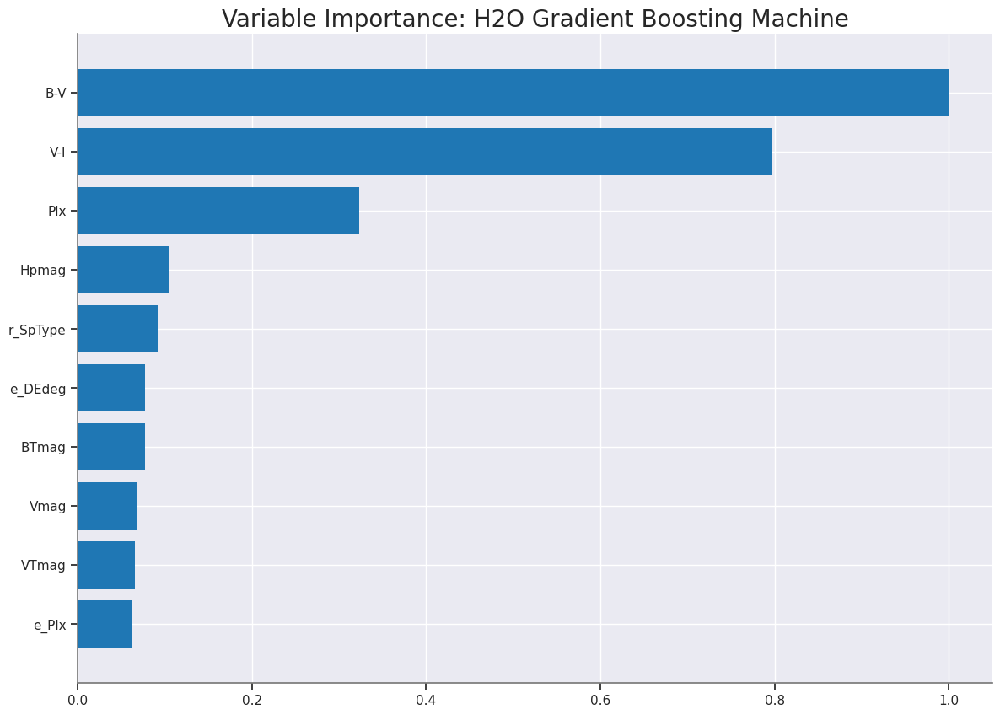

<Figure size 1600x800 with 0 Axes>

In [99]:
if best_model.algo in [
    "gbm",
    "drf",
    "xrt",
    "xgboost",
]:  # Importance of all the variables in GBM algorithm.
    best_model.varimp_plot()

The above graph is a variable Importance Graph on the H20's Distributed Random Forest Model
- We can Interpret that Alcohol is the Most Important Variable among all with importance of 1.0 (Think as if this Importance is scaled to 100%)
- Sulphate is 0.55 (Think as if it is 55% Important than Alcohol was)

And So On..

<>:1: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:1: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<ipython-input-100-0cab54a0793b>:1: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if glm_index is not 0:


62
glm


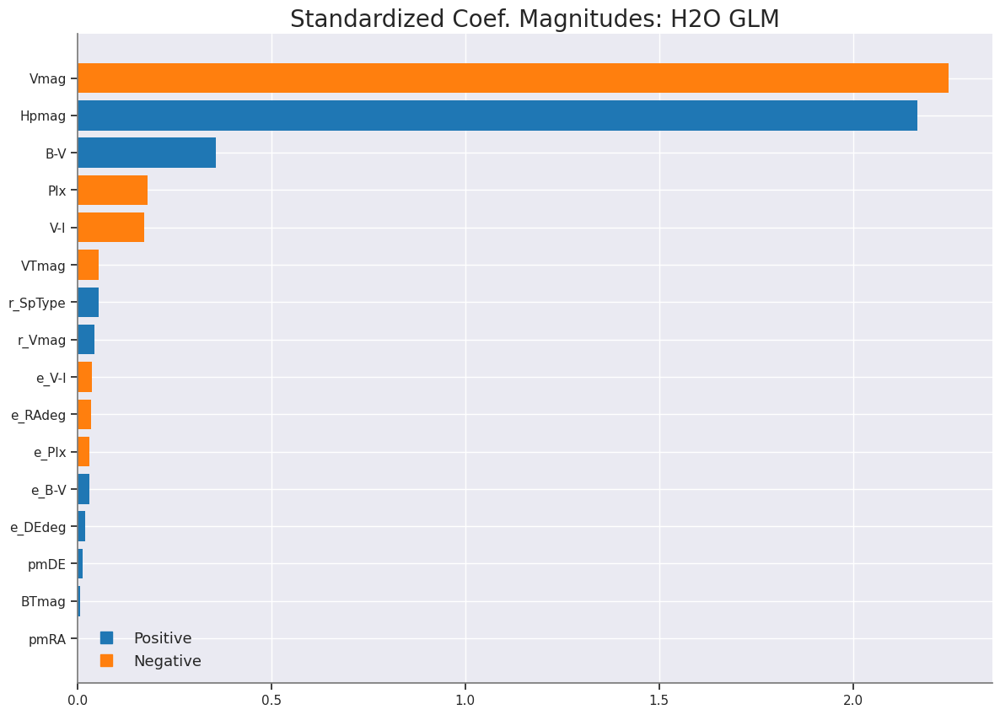

In [100]:
if glm_index is not 0:
    print(glm_index)
    glm_model = h2o.get_model(aml.leaderboard[glm_index, "model_id"])
    print(glm_model.algo)
    glm_model.std_coef_plot()

Standardized coefficient magnitudes (sometimes referred to as standardized coefficients or beta coefficients) are a measure of the importance of each input variable in a predictive model, after standardizing all variables to have a mean of zero and a standard deviation of one. The values of standardized coefficient magnitudes can range from negative infinity to positive infinity, but they are typically expressed as a percentage.

The values on standardized coefficient magnitudes represent the relative importance of each input variable in the model, after taking into account the scale of the variable. A higher magnitude value indicates that the variable has a stronger impact on the outcome variable, while a lower value indicates a weaker impact.

In [101]:
print(best_model.rmse(train=True))

0.20927314379897477


In [102]:
def model_performance_stats(perf):
    d = {}
    try:
        d["mse"] = perf.mse()
    except:
        pass
    try:
        d["rmse"] = perf.rmse()
    except:
        pass
    try:
        d["null_degrees_of_freedom"] = perf.null_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_degrees_of_freedom"] = perf.residual_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_deviance"] = perf.residual_deviance()
    except:
        pass
    try:
        d["null_deviance"] = perf.null_deviance()
    except:
        pass
    try:
        d["aic"] = perf.aic()
    except:
        pass
    try:
        d["logloss"] = perf.logloss()
    except:
        pass
    try:
        d["auc"] = perf.auc()
    except:
        pass
    try:
        d["gini"] = perf.gini()
    except:
        pass
    return d

In [103]:
mod_perf = best_model.model_performance(df_test)
stats_test = {}
stats_test = model_performance_stats(mod_perf)
stats_test

{'mse': 0.10571493175490053,
 'rmse': 0.32513832710847934,
 'null_degrees_of_freedom': None,
 'residual_degrees_of_freedom': None,
 'residual_deviance': None,
 'null_deviance': None,
 'aic': 'NaN'}

In [104]:
predictions = best_model.predict(df_test)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [105]:
y_pred = h2o.as_list(
    predictions
)  # Predictions on Test Dataset using the best model from the leaderboard.
print(y_pred)

      predict
0    0.209343
1    0.994765
2    0.224059
3    0.258987
4   -0.036825
..        ...
284  0.380053
285  0.142957
286  0.222787
287  0.165571
288 -0.016044

[289 rows x 1 columns]


/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


In [106]:
y1_test = h2o.as_list(df_test[y])  # Real Answers
y1_test

/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


,SpType
0,0
1,1
2,1
3,0
4,0
...,...
284,1
285,1
286,0
287,0


In [107]:
print(X)

['BTmag', 'e_Plx', 'e_DEdeg', 'e_RAdeg', 'pmDE', 'pmRA', 'Plx', 'Vmag', 'B-V', 'VTmag', 'V-I', 'Hpmag', 'e_B-V', 'e_V-I', 'r_Vmag', 'r_SpType']


### Regularization
In this Section, we will be using the GLM model to check if regularization is helping us to improve the accuracy and reduce overfitting.
- Ridge and Lasso are regularization techniques used in linear regression to prevent overfitting and improve the model's generalization ability.

- Ridge regularization adds a penalty term to the least-squares objective function of the linear regression model. This penalty term is proportional to the square of the magnitude of the coefficients of the model, which shrinks the coefficients towards zero. The strength of the penalty is controlled by a hyperparameter called the regularization parameter, which needs to be tuned to achieve the best performance. Ridge regularization is particularly useful when there are many input variables that are correlated with each other, as it can help to reduce the variance of the model by reducing the effect of these correlated variables.

- Lasso regularization is similar to Ridge regularization, but instead of adding a penalty term proportional to the square of the coefficients, it adds a penalty term proportional to the absolute value of the coefficients. This penalty term can set some coefficients to exactly zero, which makes Lasso regularization a useful method for feature selection. By setting some coefficients to zero, Lasso can effectively remove irrelevant variables from the model, which can lead to a simpler and more interpretable model.

- The main difference between Ridge and Lasso regularization is the type of penalty function used. Ridge uses L2 regularization, while Lasso uses L1 regularization. L2 regularization tends to distribute the penalty evenly across all coefficients, while L1 regularization tends to concentrate the penalty on a smaller subset of the most important coefficients. Which method to use depends on the specific problem and the properties of the input variables.

In [108]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

star_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5
)  # Elastic Net Regularization
star_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5
)  # RIDGE Regularization
star_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5
)  # LASSO Regularization
star_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)  # Lambda Search

This code is creating two generalized linear regression models using the H2O machine learning platform with different regularization methods: Ridge and Lasso.

- The first model, "wine_glm_regularization_ridge," is using Ridge regularization. The "family" argument is set to "gaussian," which means that the response variable is continuous and the model is using a normal (Gaussian) error distribution. The "alpha" argument is set to 0, which means that the model is using Ridge regularization. The "nfolds" argument is set to 5, which means that the model is using 5-fold cross-validation to evaluate the performance of the model.
- The second model, "wine_glm_regularization_lasso," is using Lasso regularization. The "family" and "nfolds" arguments are the same as in the Ridge model, but the "alpha" argument is set to 1, which means that the model is using Lasso regularization.
- This code creates a generalized linear regression model using H2O with the option of performing lambda search for L1 and L2 regularization.

In [109]:
star_glm.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |

/usr/local/lib/python3.10/dist-packages/h2o/estimators/estimator_base.py:192: RuntimeWarning: We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
  warnings.warn(mesg["message"], RuntimeWarning)


██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,None,16,16,1,py_2_sid_bd29
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
aic,193.32024,11.819134,192.82378,208.39624,188.15932,200.01807,177.20381
loglikelihood,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mae,0.2519193,0.0078170,0.2638030,0.2514152,0.2464520,0.2542344,0.2436917
mean_residual_deviance,0.1126379,0.0083423,0.1141158,0.1227042,0.1053582,0.1180148,0.1029963
mse,0.1126379,0.0083423,0.1141158,0.1227042,0.1053582,0.1180148,0.1029963
null_deviance,60.43043,3.1303914,58.213432,58.512623,65.06331,58.058105,62.304688
r2,0.5465658,0.0343386,0.5354531,0.5091743,0.5785609,0.5229222,0.5867186
residual_deviance,27.21192,1.0444596,26.817205,28.590069,27.287771,27.615465,25.749084


### Ridge Regularization

In [110]:
star_glm_regularization_ridge.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Ridge ( lambda = 2.824E-4 ),16,16,1,py_2_sid_bd29
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
aic,190.69759,21.284445,196.92786,158.82816,207.8834,209.52821,180.3203
loglikelihood,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mae,0.2568844,0.0080255,0.2540370,0.2464615,0.2611486,0.2677963,0.2549783
mean_residual_deviance,0.1111066,0.0079343,0.1055682,0.1010667,0.1170916,0.1202908,0.1115157
mse,0.1111066,0.0079343,0.1055682,0.1010667,0.1170916,0.1202908,0.1115157
null_deviance,60.395306,4.8695116,67.80113,56.41409,61.60081,60.527687,55.6328
r2,0.5533834,0.0319006,0.5741559,0.5956612,0.5279186,0.5188284,0.5503527
residual_deviance,26.913692,2.899235,28.82013,22.740017,29.038715,28.990088,24.979513


The regularization appears to have helped in reducing the cross-validation metrics.
- The mean squared error (Improved by 0.468%),
- root mean squared error (Improved by 0.234%),
- mean absolute error(Improved by 0.298%),
and root mean squared logarithmic error are all lower in the model with regularization compared to the model without regularization. Additionally, the residual deviance and AIC are also lower in the model with regularization. The R-squared value is slightly higher in the model with regularization, which means that the regularization helped the model to better generalize to new data.

### Lasso Regularization

In [111]:
star_glm_regularization_lasso.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Lasso (lambda = 2.824E-4 ),16,16,1,py_2_sid_bd29
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
aic,191.6795,23.574207,173.13542,171.732,229.82907,188.2631,195.43794
loglikelihood,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mae,0.2560617,0.0037039,0.2564632,0.2596870,0.2536700,0.2510898,0.2593984
mean_residual_deviance,0.1115109,0.0051664,0.1077831,0.1067471,0.1197151,0.1104658,0.1128434
mse,0.1115109,0.0051664,0.1077831,0.1067471,0.1197151,0.1104658,0.1128434
null_deviance,60.520275,4.650144,56.59331,55.92652,67.48528,61.651844,60.944416
r2,0.5498108,0.0180559,0.5648156,0.5592033,0.5192478,0.5572296,0.5485574
residual_deviance,27.081266,3.3144395,24.574558,24.12484,32.442787,26.843185,27.420958


### Which Regularization Method Helps ?

- The Lasso regularization appears to have increased the MSE, RMSE, MAE, and RMSLE values compared to the non-regularized and Ridge regularized models, indicating worse performance. The R-squared value also decreased, indicating a worse fit to the data.

- So based on these metrics, it seems that Lasso did not help in this case and performed worse than Ridge. However, it's always a good practice to try multiple regularization techniques and compare their performance using different metrics, as the optimal regularization method can depend on the specific dataset and modeling task.

- Here, we can observe that after applying the ridge regularization, there is a slight improvement in the evaluation metrics on the cross validation data, hence it can be concluded that Ridge regularization helps us avoid the overfitting of model and improvements of metrics on the validation dataset.

In [112]:
lambda_search = star_glm_regularization_lamba_search.train(
    x=X, y=y, training_frame=df_train
)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


In [113]:
lambda_search

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1712103616560_28


GLM Model: summary
    family    link      regularization                                 lambda_search                                                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ---------------------------------------------  ----------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 5.648E-5 )  nlambda = 100, lambda.max = 0.5648, lambda.min = 5.648E-5, lambda.1se = -1.0  16                            16                             100                     py_2_sid_bd29

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.10522640392347393
RMSE: 0.3243861956425919
MAE: 0.24724791565624538
RMSLE: 0.22576555845664226
Mean Residual Deviance: 0.10522640392347393
R^2: 0.5776425784594879
Null degrees of freedom: 1210
Residual degrees of freedom: 1194
Null deviance: 301.70933113129536
Residual deviance: 127.42917515132693
AIC: 745.9318494103734

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train       alpha    iterations    training_rmse       training_deviance    training_mae         training_r2
---  -------------------  ----------  -----------  --------  ------------  -------------------  -------  ------------  ------------------  -------------------  -------------------  ------------------
     2024-04-03 00:28:12  0.000 sec   1            .56E0     1             0.2491406532876106   0.5
     2024-04-03 00:28:12  0.003 sec   2            .51E0     2             0.23826278889037497  0.5
     2024-04-03 00:28:12  0.005 sec   3            .47E0     2             0.22869997988368515  0.5
     2024-04-03 00:28:12  0.007 sec   4            .43E0     2             0.2203277577324544   0.5
     2024-04-03 00:28:12  0.008 sec   5            .39E0     2             0.21302630421315535  0.5
     2024-04-03 00:28:12  0.009 sec   6            .35E0     3             0.20522259766726955  0.5
     2024-04-03 00:28:12  0.010 sec   7            .32E0     3             0.19665170677301513  0.5
     2024-04-03 00:28:12  0.013 sec   8            .29E0     3             0.18929818795555325  0.5
     2024-04-03 00:28:12  0.022 sec   9            .27E0     4             0.17952005536958698  0.5
     2024-04-03 00:28:12  0.025 sec   10           .24E0     4             0.170316675433833    0.5
---  ---                  ---         ---          ---       ---           ---                  ---      ---           ---                 ---                  ---                  ---
     2024-04-03 00:28:12  0.115 sec   91           .13E-3    17            0.10541871370035417  0.5
     2024-04-03 00:28:12  0.123 sec   92           .12E-3    17            0.10538403931467316  0.5
     2024-04-03 00:28:12  0.126 sec   93           .11E-3    17            0.10535364158840277  0.5
     2024-04-03 00:28:12  0.127 sec   94           .99E-4    17            0.10532716704373864  0.5
     2024-04-03 00:28:12  0.128 sec   95           .9E-4     17            0.10530415501174104  0.5
     2024-04-03 00:28:12  0.132 sec   96           .82E-4    17            0.1052840617660854   0.5
     2024-04-03 00:28:12  0.132 sec   97           .75E-4    17            0.10526643851188483  0.5
     2024-04-03 00:28:12  0.133 sec   98           .68E-4    17            0.10525127940898038  0.5
     2024-04-03 00:28:12  0.134 sec   99           .62E-4    17            0.10523810143770834  0.5
     2024-04-03 00:28:12  0.135 sec   100          .56E-4    17            0.1052264039234822   0.5      100           0.3243861956425919  0.10522640392347393  0.24724791565624538  0.5776425784594879
[100 rows

Above  parameters are from a lambda search, which means that the model was trained on a range of different values of the regularization parameter lambda to find the value that minimized the selected loss function. Based on the reported metrics, it seems that the optimal value of lambda resulted in a slightly improved model compared to the non-regularized model. The MSE, RMSE, and MAE all decreased slightly, indicating that the model is making slightly more accurate predictions on the training data. The R^2 value, which measures how well the model fits the data, decreased slightly, which may indicate that the model is not overfitting the training data as much. Overall, the lambda search seems to have resulted in a slightly improved model.

- MSE improved from 0.4234393816333662 to 0.42185125944877285, or by 0.375%
- RMSE improved from 0.6507222000465069 to 0.6493051832461667, or by 0.218%
- MAE improved from 0.5049750807378458 to 0.5035142349852977, or by 0.290%
- RMSLE improved from 0.09927527847388463 to 0.09893003268921823, or by 0.348%
- R-squared improved from 0.358097238638058 to 0.3603008092769123, or by 0.616%


Here we can observe that regularization helps a bit in reducing the overfitting of our GLM model.

In [114]:
coeff_table = star_glm._model_json["output"]["coefficients_table"]

In [115]:
coeff_table.as_data_frame()  # Z-Value and P-Value showing the significance of each attributes.

,names,coefficients,std_error,z_value,p_value,standardized_coefficients
0,Intercept,0.916302,0.154635,5.925583,4.066371e-09,0.529315
1,BTmag,0.025165,0.172047,0.146267,8.837355e-01,0.004213
2,e_Plx,-0.245103,0.160273,-1.529281,1.264597e-01,-0.031351
3,e_DEdeg,0.193096,0.160148,1.205736,2.281584e-01,0.019892
4,e_RAdeg,-0.335534,0.163929,-2.046818,4.089455e-02,-0.036048
5,pmDE,0.227843,0.177782,1.281586,2.002367e-01,0.012746
6,pmRA,-0.022713,0.243646,-0.093222,9.257431e-01,-0.000944
7,Plx,-2.068018,0.126550,-16.341478,2.502609e-54,-0.182758
8,Vmag,-15.356961,1.873369,-8.197512,6.274097e-16,-2.627441
9,B-V,1.866806,0.196073,9.520958,9.156281e-21,0.359980


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GBM_4_AutoML_1_20240403_02422,0.308877,0.0954051,0.194434,0.215659,0.0954051,998,0.022276,GBM
StackedEnsemble_AllModels_1_AutoML_1_20240403_02422,0.309384,0.0957186,0.192563,0.213944,0.0957186,361,0.094217,StackedEnsemble
GBM_grid_1_AutoML_1_20240403_02422_model_5,0.310495,0.0964074,0.189247,0.217222,0.0964074,602,0.025803,GBM
GBM_grid_1_AutoML_1_20240403_02422_model_4,0.31113,0.0968022,0.206871,0.217455,0.0968022,373,0.023053,GBM
StackedEnsemble_AllModels_2_AutoML_1_20240403_02422,0.312153,0.0974396,0.191899,0.216043,0.0974396,311,0.13924,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20240403_02422,0.312199,0.0974681,0.194051,0.216322,0.0974681,285,0.072053,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_1_20240403_02422,0.312563,0.0976958,0.205756,0.217354,0.0976958,262,0.053396,StackedEnsemble
GBM_grid_1_AutoML_1_20240403_02422_model_2,0.312876,0.0978911,0.196407,0.217257,0.0978911,314,0.014858,GBM
GBM_2_AutoML_1_20240403_02422,0.313027,0.0979862,0.19085,0.218757,0.0979862,494,0.01839,GBM
StackedEnsemble_BestOfFamily_3_AutoML_1_20240403_02422,0.313537,0.0983055,0.192515,0.217375,0.0983055,296,0.076742,StackedEnsemble


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

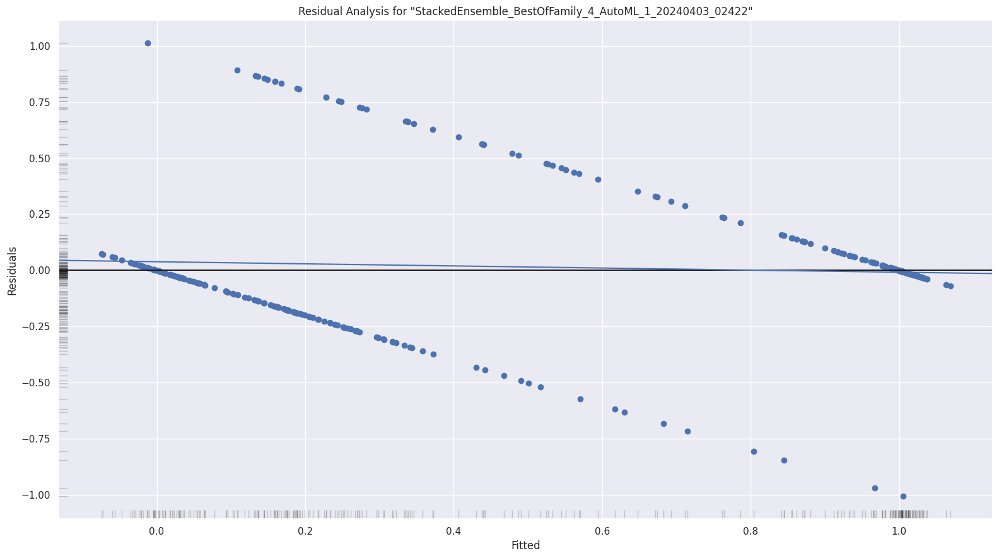

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

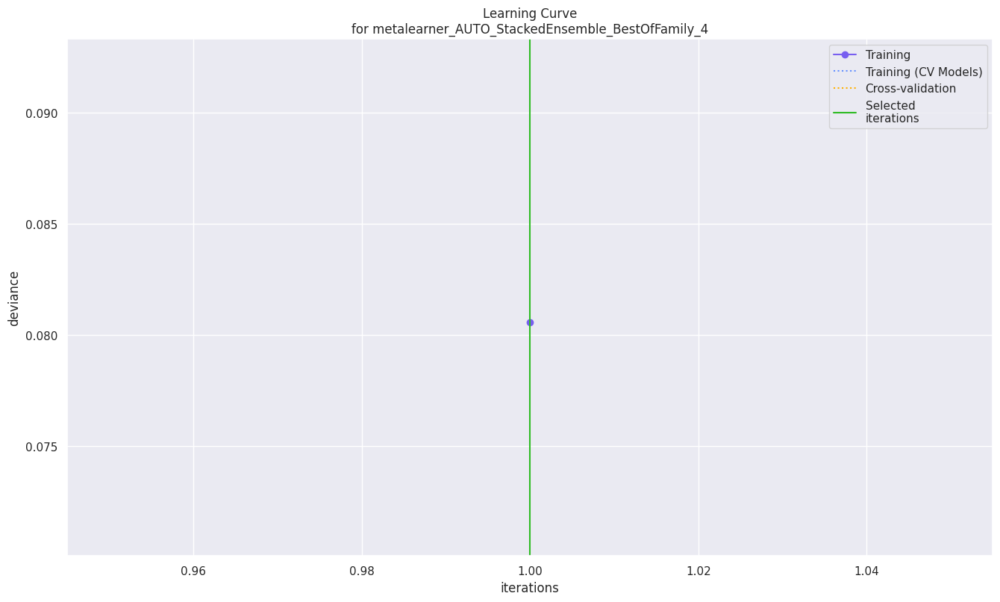

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

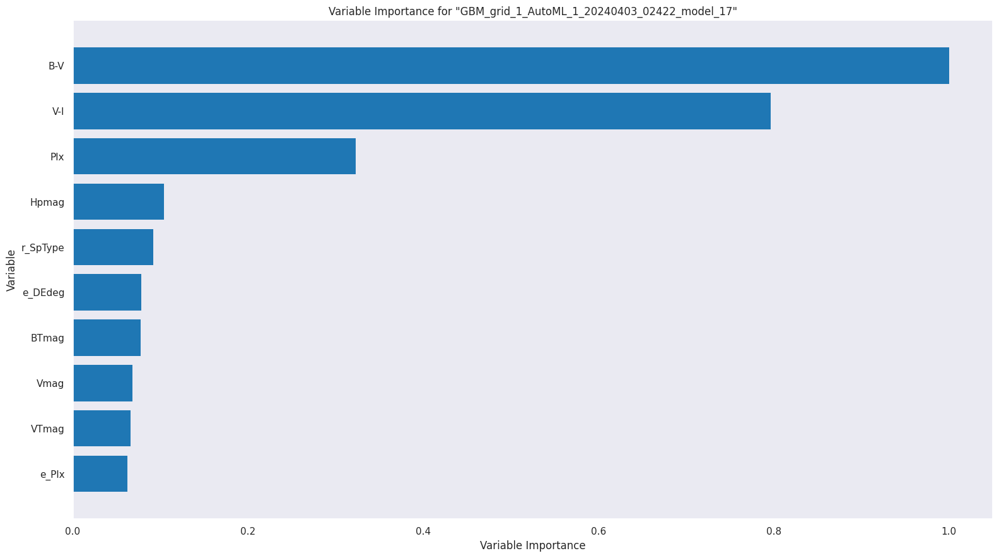

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

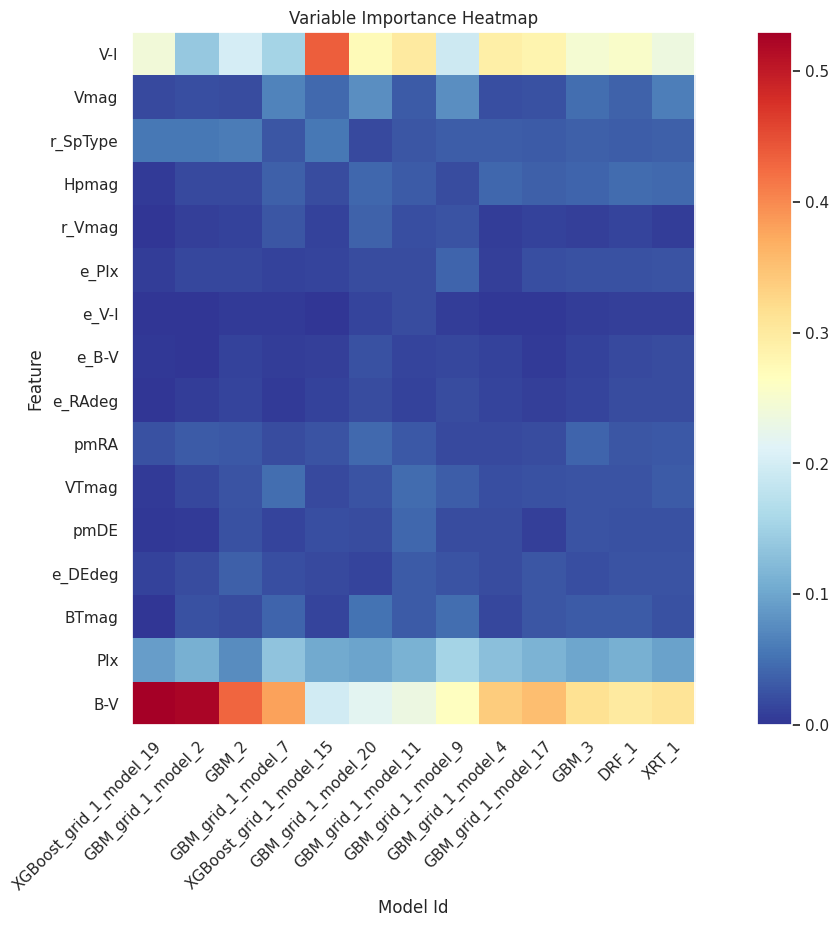

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

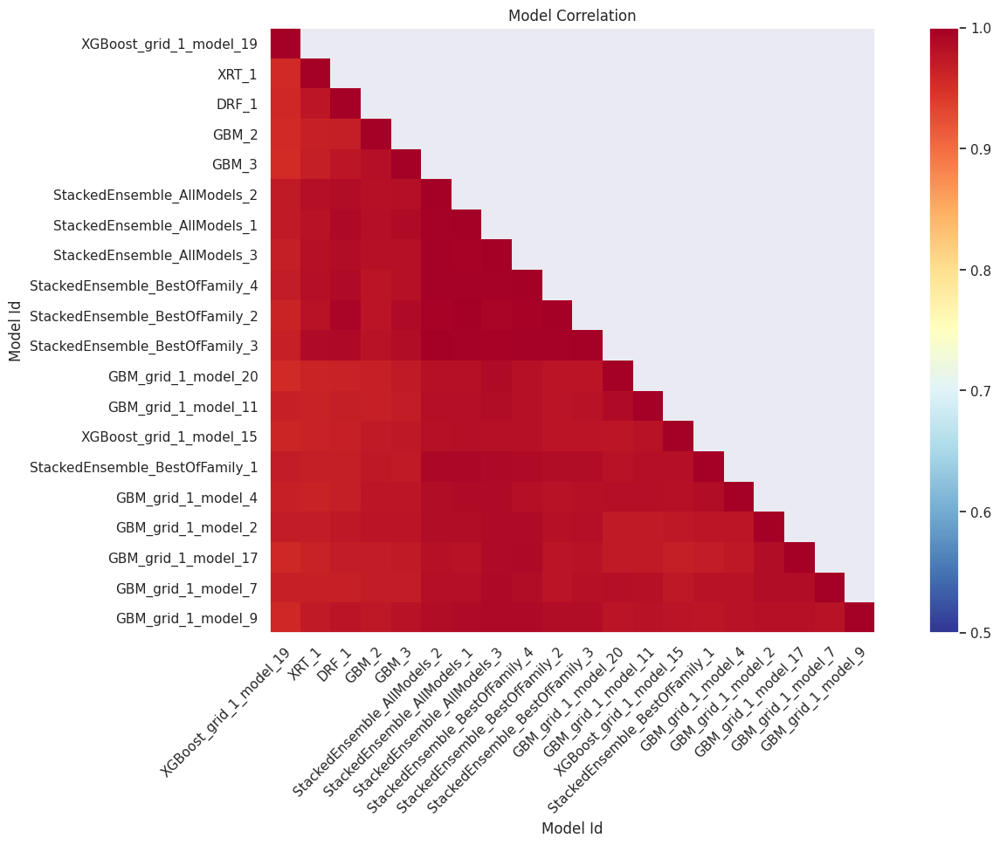

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

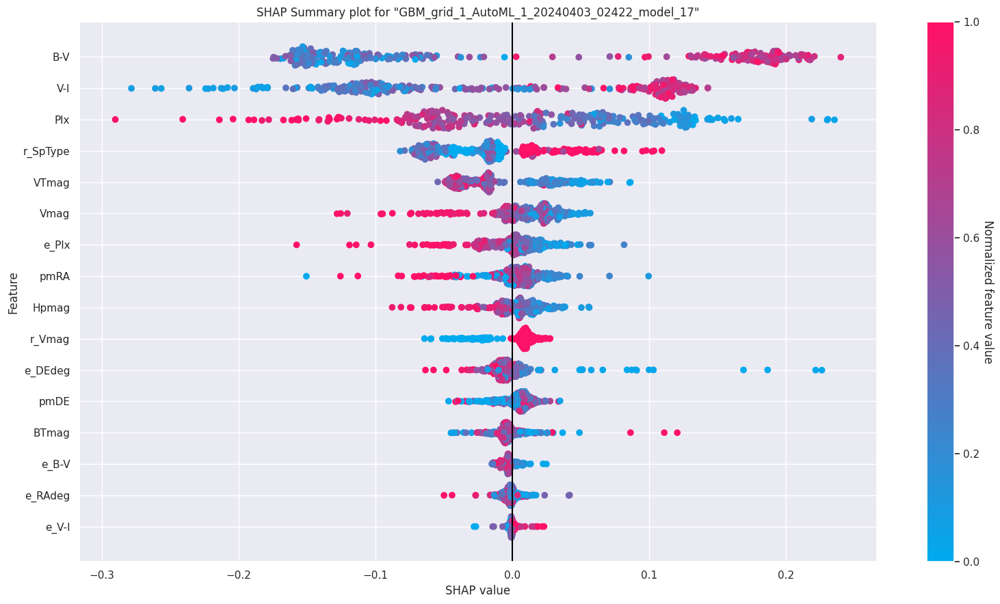

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

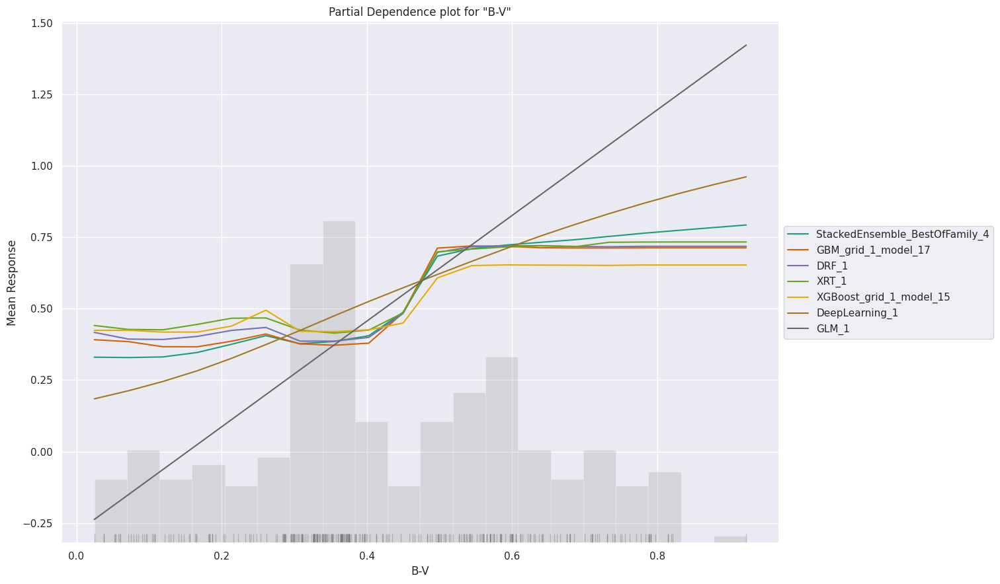

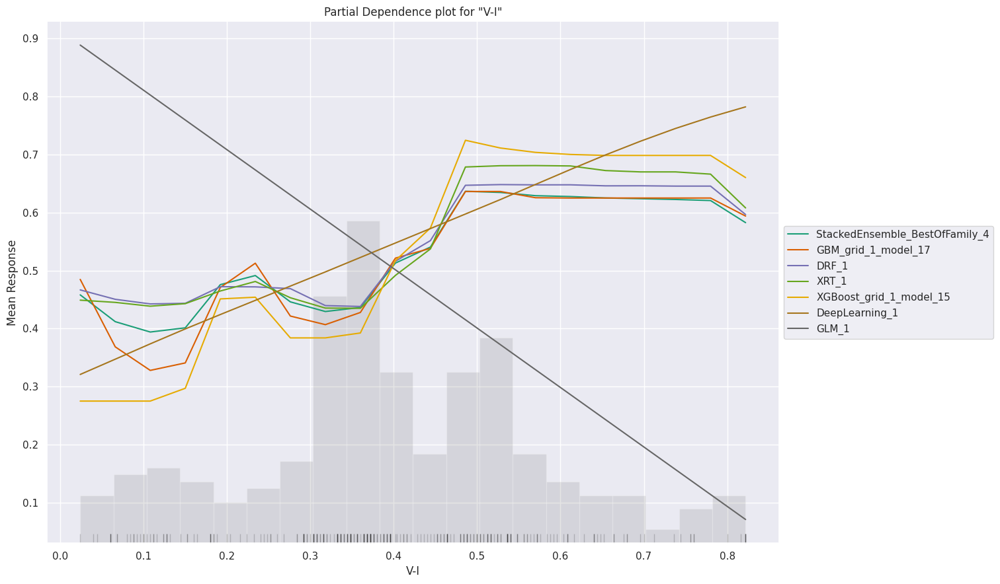

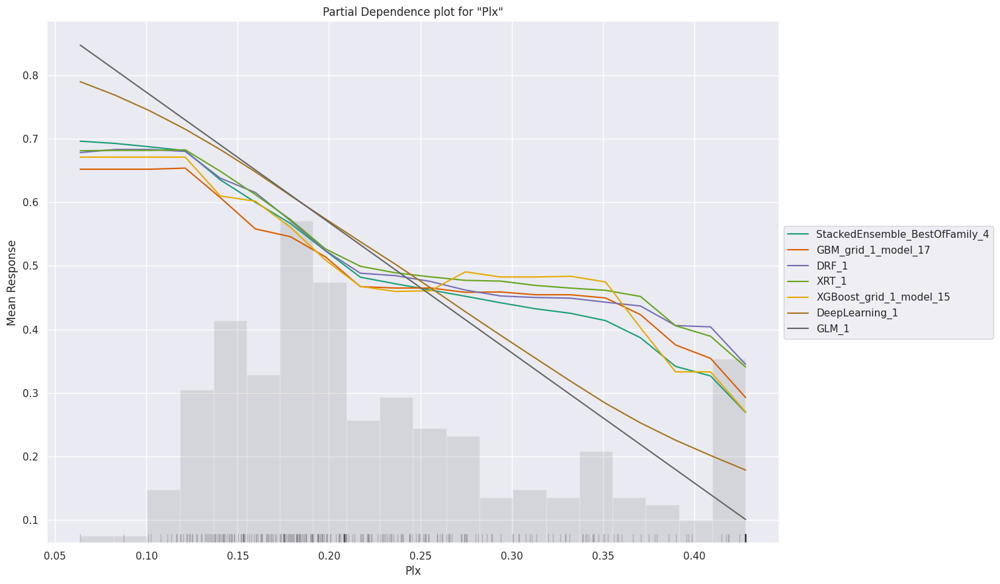

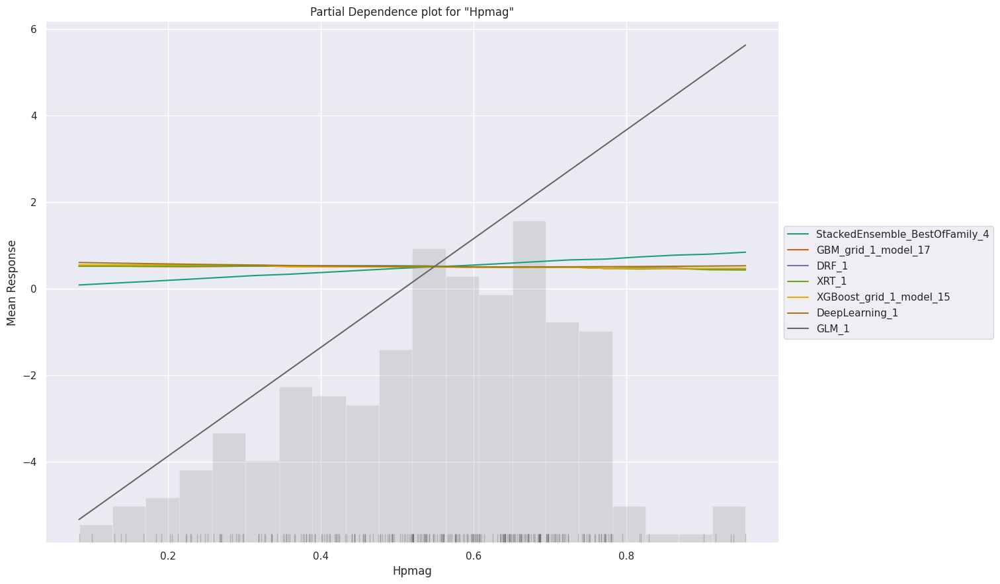

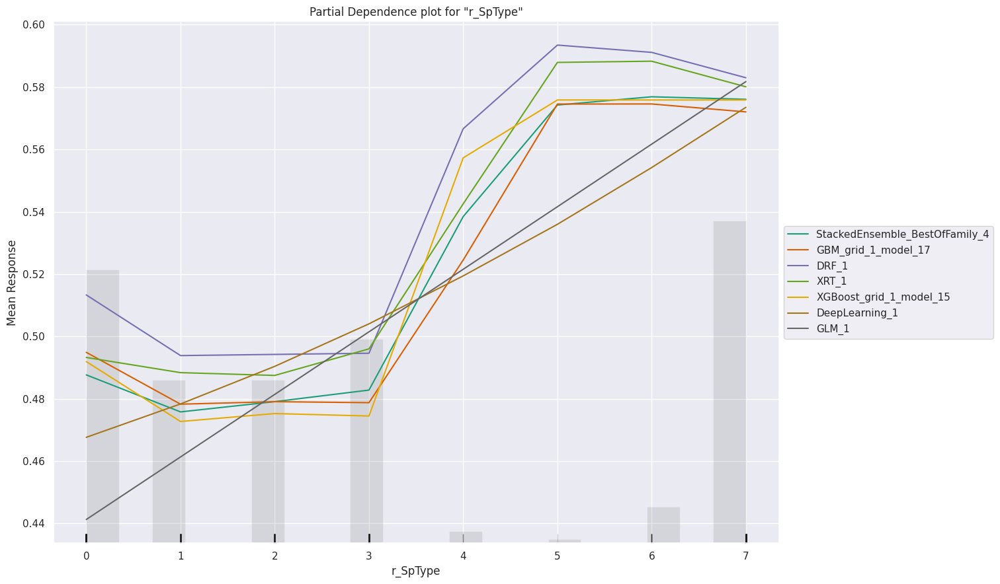

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

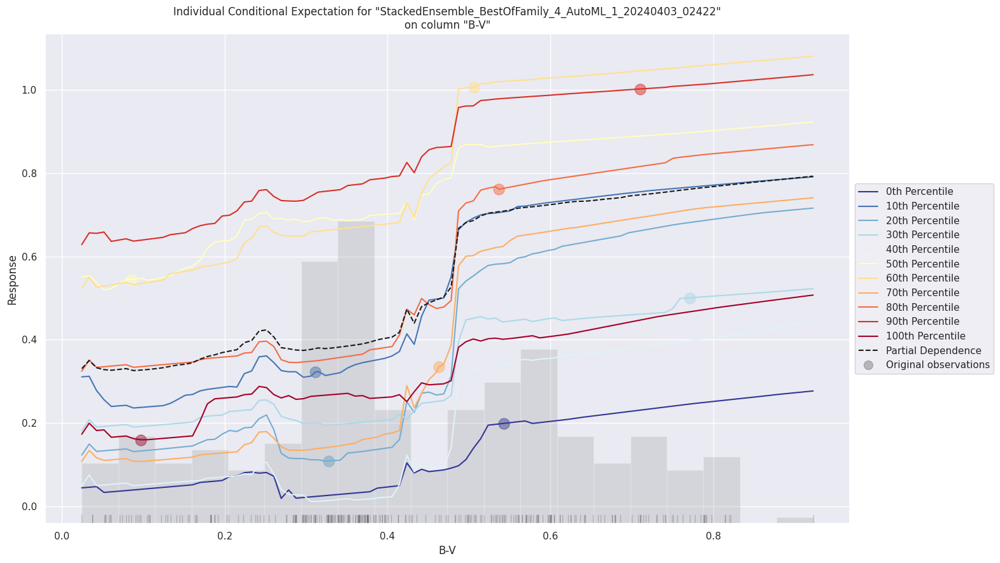

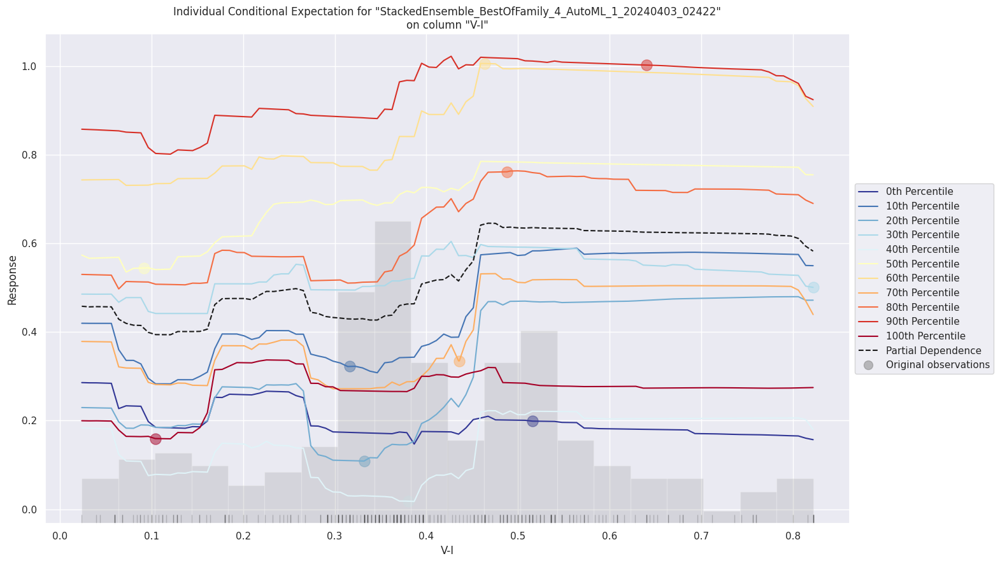

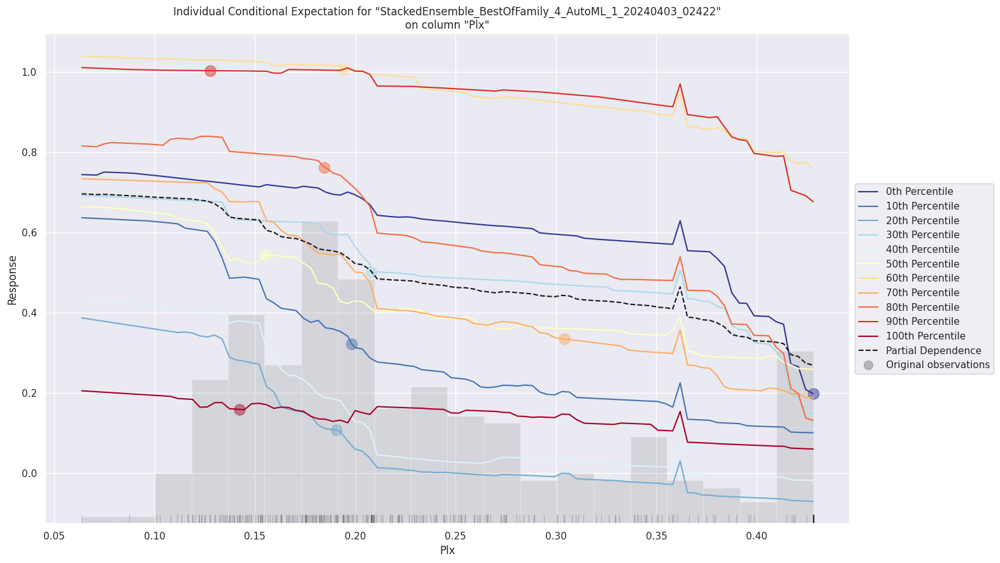

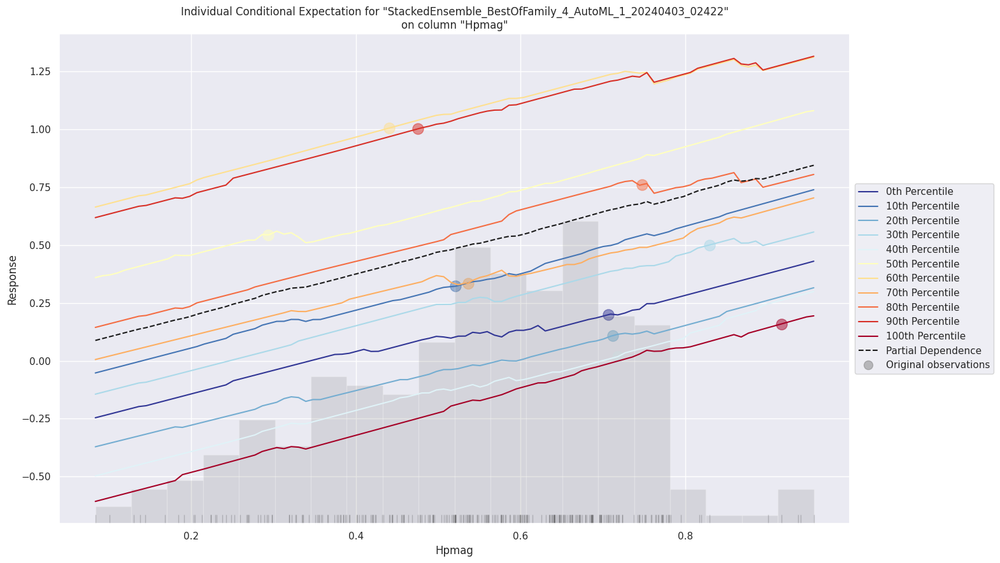

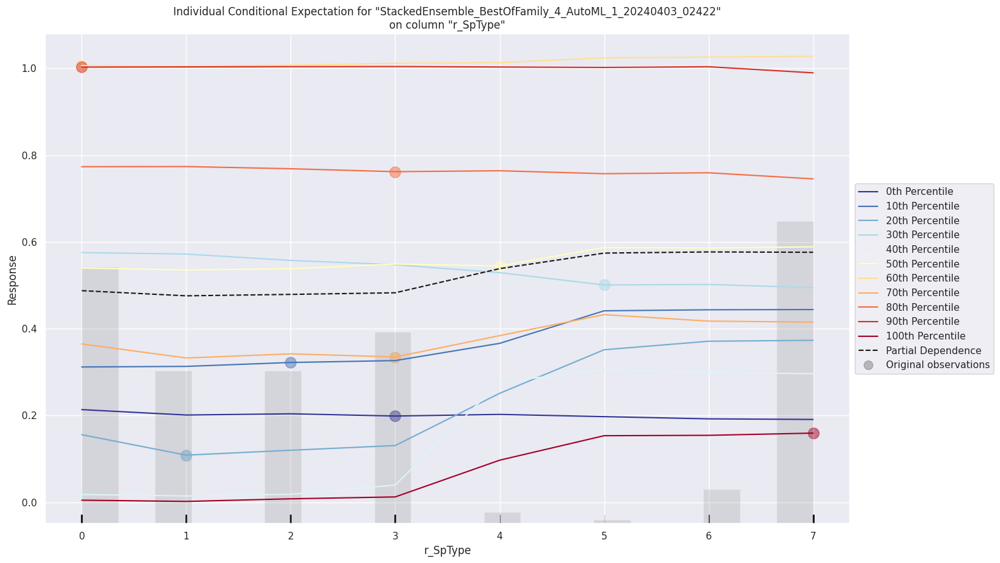

In [116]:
exa = aml.explain(df_test)

In [43]:
import statsmodels.formula.api as smf  # OLS model Library

In [44]:
import h2o

pandas_df = h2o.as_list(df)

/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


In [45]:
print(pandas_df.dtypes)


BTmag       float64
e_Plx       float64
e_DEdeg     float64
e_RAdeg     float64
pmDE        float64
pmRA        float64
Plx         float64
Vmag        float64
B-V         float64
VTmag       float64
V-I         float64
Hpmag       float64
e_B-V       float64
e_V-I       float64
r_Vmag        int64
r_SpType      int64
SpType        int64
dtype: object


In [46]:
import statsmodels.api as smf

model = smf.OLS(pandas_df['SpType'], pandas_df[['BTmag', 'e_Plx', 'e_DEdeg', 'e_RAdeg', 'pmDE', 'pmRA', 'Plx', 'Vmag', 'B-V', 'VTmag', 'V-I', 'Hpmag', 'e_B-V', 'e_V-I', 'r_Vmag', 'r_SpType']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                 SpType   R-squared (uncentered):                   0.776
Model:                            OLS   Adj. R-squared (uncentered):              0.774
Method:                 Least Squares   F-statistic:                              321.2
Date:                Wed, 03 Apr 2024   Prob (F-statistic):                        0.00
Time:                        01:06:02   Log-Likelihood:                         -526.51
No. Observations:                1500   AIC:                                      1085.
Df Residuals:                    1484   BIC:                                      1170.
Df Model:                          16                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
BTmag          0.1145      0.163      0.703      0.482      -0.205       0.434
e_Plx         -0.2636      0.112     -2.345      0.019      -0.484      -0.043
e_DEdeg        0.1326      0.100      1.321      0.187      -0.064       0.329
e_RAdeg       -0.2422      0.111     -2.184      0.029      -0.460      -0.025
pmDE           0.6491      0.081      8.048      0.000       0.491       0.807
pmRA           0.2998      0.124      2.413      0.016       0.056       0.544
Plx           -1.1416      0.080    -14.226      0.000      -1.299      -0.984
Vmag          -8.4569      1.732     -4.882      0.000     -11.855      -5.059
B-V            1.7357      0.170     10.228      0.000       1.403       2.069
VTmag         -0.1731      0.251     -0.690      0.491      -0.665       0.319
V-I           -0.6887      0.184     -3.743      0.000      -1.050      -0.328
Hpmag          7.9777      1.744      4.574      0.000       4.557      11.399
e_B-V          0.0125      0.164      0.076      0.939      -0.309       0.333
e_V-I         -0.1231      0.100     -1.236      0.217      -0.318       0.072
r_Vmag         0.1408      0.021      6.670      0.000       0.099       0.182
r_SpType       0.0303      0.004      8.348      0.000       0.023       0.037
==============================================================================
Omnibus:                       68.242   Durbin-Watson:                   1.974
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               78.138
Skew:                           0.511   Prob(JB):                     1.08e-17
Kurtosis:                       3.453   Cond. No.                     1.20e+03
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 1.2e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Hyperparameter Tuning - Random Grid Search on GBM Model

In [128]:
train, validate, test = np.split(
    pandas_df.sample(frac=1, random_state=42), [int(0.6 * len(df)), int(0.8 * len(df))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [129]:
gbm_parameters = {
    "learn_rate": [i * 0.01 for i in range(1, 11)],
    "max_depth": list(range(2, 11)),
    "sample_rate": [i * 0.1 for i in range(5, 11)],
    "col_sample_rate": [i * 0.1 for i in range(1, 11)],
}

In [130]:
search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}

In [131]:
gbm_grid2 = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id="gbm_grid2",
    hyper_params=gbm_parameters,
    search_criteria=search_criteria,
)

In [132]:
print(y)

SpType


In [64]:
import pandas as pd


In [133]:
gbm_grid2.train(
    x=X, y=y, training_frame=train, validation_frame=validate, ntrees=100, seed=1
)

gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.9,0.09,8.0,0.9,gbm_grid2_model_36,0.0835357
,0.9,0.07,4.0,0.9,gbm_grid2_model_17,0.0837548
,0.9,0.04,4.0,0.9,gbm_grid2_model_31,0.0839951
,0.6000000,0.1,4.0,1.0,gbm_grid2_model_22,0.0847176
,0.7000000,0.03,6.0,1.0,gbm_grid2_model_6,0.0850066
,0.8,0.03,9.0,0.9,gbm_grid2_model_8,0.0855170
,0.5,0.05,7.0,0.9,gbm_grid2_model_2,0.0856563
,0.5,0.1,4.0,0.8,gbm_grid2_model_33,0.0861054
,0.1,0.06,8.0,0.9,gbm_grid2_model_34,0.0862843
,0.2,0.04,5.0,0.9,gbm_grid2_model_29,0.0863271


In [134]:
gbm_gridperf2 = gbm_grid2.get_grid(sort_by="residual_deviance", decreasing=False)

In [135]:
gbm_gridperf2

,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.9,0.09,8.0,0.9,gbm_grid2_model_36,0.0835357
,0.9,0.07,4.0,0.9,gbm_grid2_model_17,0.0837548
,0.9,0.04,4.0,0.9,gbm_grid2_model_31,0.0839951
,0.6000000,0.1,4.0,1.0,gbm_grid2_model_22,0.0847176
,0.7000000,0.03,6.0,1.0,gbm_grid2_model_6,0.0850066
,0.8,0.03,9.0,0.9,gbm_grid2_model_8,0.0855170
,0.5,0.05,7.0,0.9,gbm_grid2_model_2,0.0856563
,0.5,0.1,4.0,0.8,gbm_grid2_model_33,0.0861054
,0.1,0.06,8.0,0.9,gbm_grid2_model_34,0.0862843
,0.2,0.04,5.0,0.9,gbm_grid2_model_29,0.0863271


In [136]:
list_hyperparameters = []
for i in range(36):
    hyperparameters = gbm_gridperf2.get_hyperparams_dict(i)
    list_hyperparameters.append(hyperparameters)

Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperp

In [137]:
models = gbm_gridperf2.models

In [138]:
list_residual_deviance = []
for i in range(36):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    residual_deviance = performance_metrics.mean_residual_deviance()
    list_residual_deviance.append(residual_deviance)

In [139]:
for i in range(36):
    list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]

In [140]:
hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)

In [141]:
print(hyperparameters_dataframe)

    col_sample_rate  learn_rate  max_depth  sample_rate  Residual_Deviance
0               0.9        0.09          8          0.9           0.083536
1               0.9        0.07          4          0.9           0.083755
2               0.9        0.04          4          0.9           0.083995
3               0.6        0.10          4          1.0           0.084718
4               0.7        0.03          6          1.0           0.085007
5               0.8        0.03          9          0.9           0.085517
6               0.5        0.05          7          0.9           0.085656
7               0.5        0.10          4          0.8           0.086105
8               0.1        0.06          8          0.9           0.086284
9               0.2        0.04          5          0.9           0.086327
10              0.8        0.06          9          0.6           0.086424
11              0.9        0.10          4          0.7           0.086805
12              0.9      

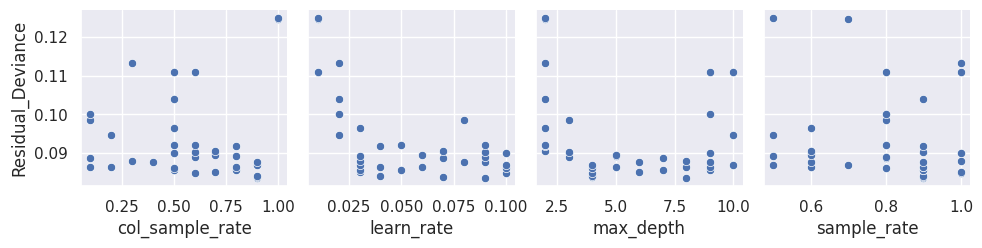

In [142]:
sns.pairplot(
    hyperparameters_dataframe,
    y_vars=["Residual_Deviance"],
    x_vars=["col_sample_rate", "learn_rate", "max_depth", "sample_rate"],
)

The image above have a set of residual deviance plots from a hyperparameter tuning process of a machine learning model. Here's how you can interpret these plots:

1. **Column Sample Rate (`col_sample_rate`):** This plot shows the effect of varying the column sample rate on the residual deviance of the model. The column sample rate specifies the proportion of features to be randomly selected to train each tree in an ensemble method like Random Forest or Gradient Boosting. Generally, a lower residual deviance is better. In this plot, there isn't a clear trend indicating an optimal rate, but the lowest deviance seems to occur around 0.25 to 0.5.

2. **Learning Rate (`learn_rate`):** This plot illustrates the impact of the learning rate on the residual deviance. The learning rate is a critical hyperparameter for models that use gradient descent optimization, such as neural networks or gradient boosting machines. It controls the step size at each iteration while moving toward a minimum of a loss function. It seems that lower learning rates (closer to 0.025) are associated with lower residual deviance, suggesting that the model benefits from a more gradual learning process.

3. **Maximum Depth (`max_depth`):** This plot shows the effect of the maximum depth of the trees on the residual deviance. The maximum depth controls the size of the tree. Deeper trees can model more complex relationships but can also lead to overfitting. It appears that residual deviance tends to increase beyond a certain depth, indicating that a shallower tree might prevent overfitting and perform better in terms of residual deviance.

4. **Sample Rate (`sample_rate`):** This plot depicts how the sample rate affects the residual deviance. The sample rate refers to the fraction of the data used to train each tree in an ensemble model. From the plot, we can see that the residual deviance is relatively lower at sample rates of 0.6 and 0.8, with a slight increase at a sample rate of 1.0. This could mean that using a subset of the data (bagging) might lead to better model performance.

### General Analysis:
- The residual deviance is a measure of how well the model fits the data. Lower values indicate a better fit.
- These plots are typically used to find the best hyperparameter values that minimize the residual deviance.
- There is a balance to be found for each hyperparameter to avoid underfitting (model is too simple) or overfitting (model is too complex and does not generalize well).
- It's also important to look at these results in combination with other performance metrics (like accuracy, precision, recall, F1-score, etc.) and validation techniques (like cross-validation) to ensure that the model is robust and generalizes well to unseen data.

You can use these insights to adjust the hyperparameters of your model accordingly to achieve a better performance. It's also advisable to repeat this process several times with different subsets of data (cross-validation) to confirm these findings.

In [143]:
pip install shap

In [144]:
import pandas as pd
import shap
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn_pandas import DataFrameMapper
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt

In [145]:
print(data[y])

1       0
3       0
4       1
5       0
9       0
       ..
3999    1
4002    1
4006    0
4011    0
4014    0
Name: SpType, Length: 1500, dtype: int64


#Shap Analysis for Logistic Regression

In [146]:
from sklearn.pipeline import Pipeline
explainer = shap.Explainer(regr.predict, X_train)
shap_values = explainer(X_test)

PermutationExplainer explainer: 151it [00:26,  5.47it/s]                         


In [147]:
def sample_feature_importance(idx, type='condensed'):
    if type == 'condensed':
        return shap.plots.force(shap_values[idx])
    elif type == 'waterfall':
        return shap.plots.waterfall(shap_values[idx])
    else:
        return "Return valid visual ('condensed', 'waterfall')"

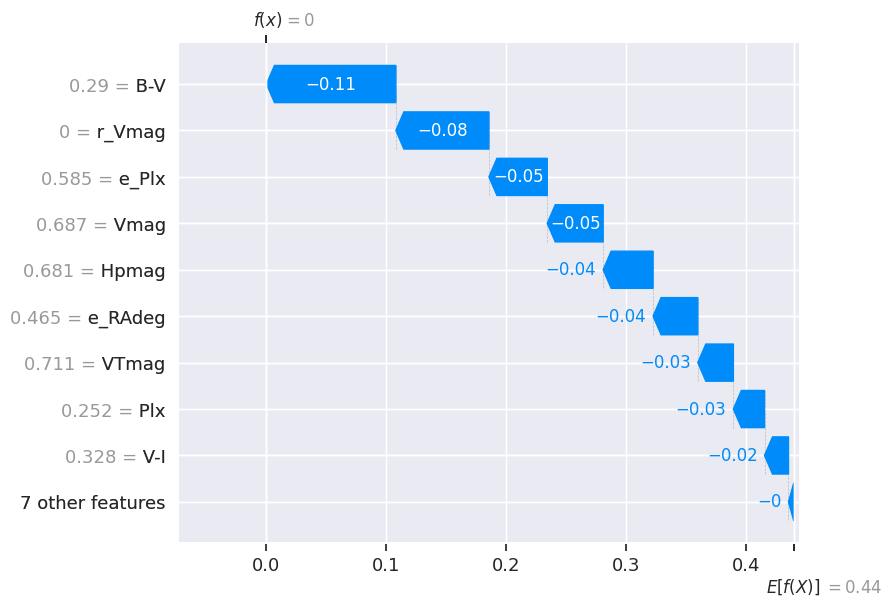

In [148]:
sample_feature_importance(0, 'waterfall')

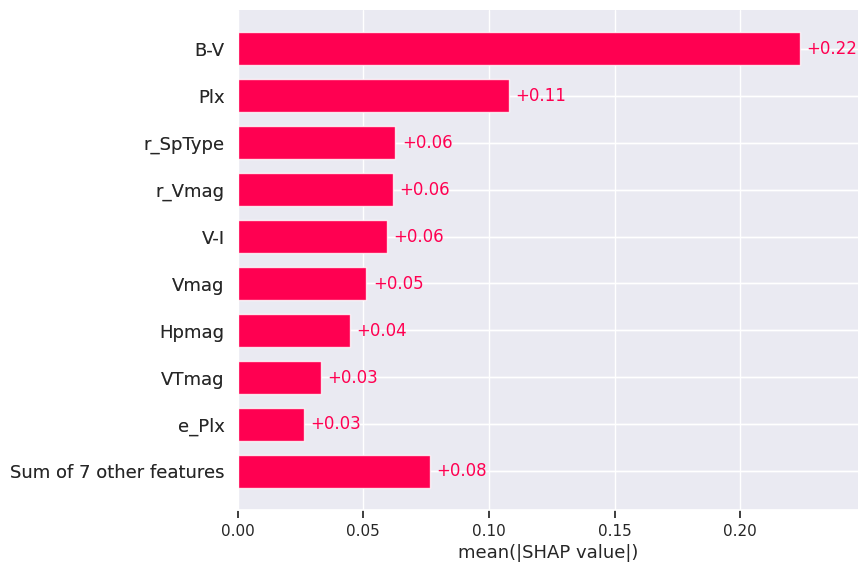

In [149]:
shap.plots.bar(shap_values)

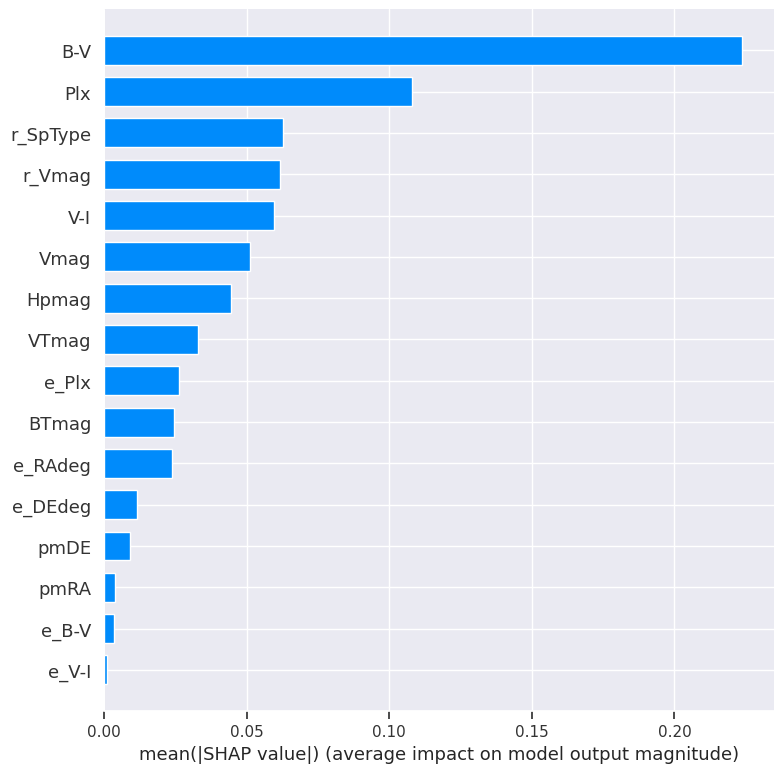

In [150]:
shap.summary_plot(shap_values.values, X_train, plot_type='bar')

###Random Forest

In [151]:
from sklearn.ensemble import RandomForestClassifier

RF_model = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)
RF_model.fit(X_train, y_train)
rf_pred = RF_model.predict(X_test)

In [152]:
print(f"Shape of y_test: {y_test.shape}")
print(f"Shape of rf_pred: {rf_pred.shape}")

Shape of y_test: (150,)
Shape of rf_pred: (150,)


In [ ]:
print(X_test.shape)

In [ ]:
print(RF_model)

In [153]:
accuracy_score(y_test, rf_pred) * 100


84.0

In [154]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

rclf = RandomForestClassifier(n_estimators=250)
rclf.fit(X_train, y_train)
random_pred = rclf.predict(X_test)
rclf.fit(X_train, y_train)

print("Accuracy:", metrics.accuracy_score(random_pred,y_test)*100)
print(metrics.classification_report(random_pred, y_test))
# ConfusionMatrixDisplay.from_predictions(random_pred, y_test, cmap = 'Blues')

Accuracy: 84.66666666666667
              precision    recall  f1-score   support

           0       0.94      0.75      0.83        77
           1       0.78      0.95      0.86        73

    accuracy                           0.85       150
   macro avg       0.86      0.85      0.85       150
weighted avg       0.86      0.85      0.85       150



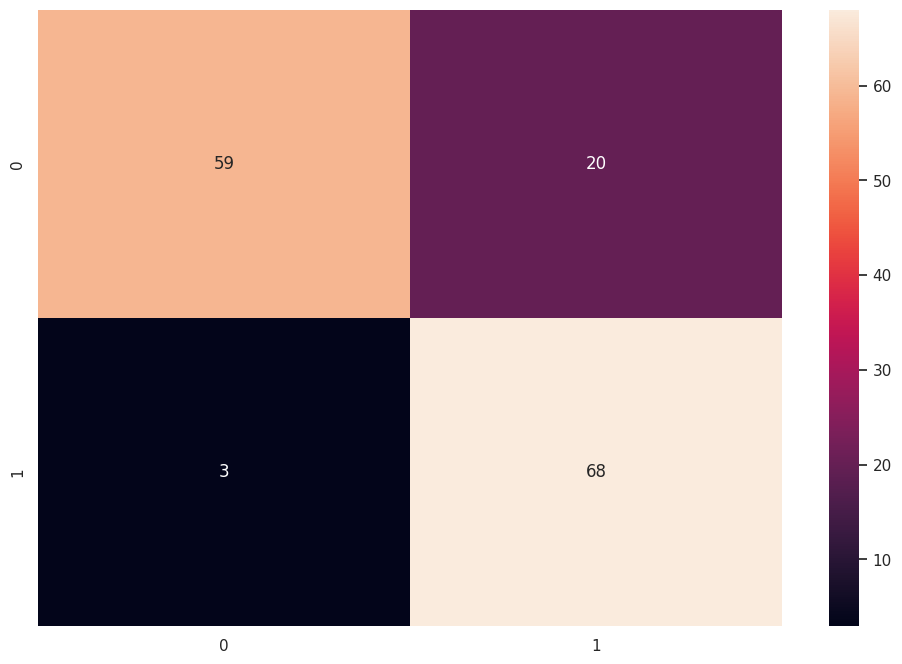

In [155]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

plt.figure(figsize=(12,8))
pred = rclf.predict(X_test)
cm = confusion_matrix(pred, y_test)
ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax)
plt.show()

In [156]:
from sklearn.pipeline import Pipeline
explainer = shap.Explainer(RF_model.predict, X_train)
shap_values = explainer(X_test)

PermutationExplainer explainer: 151it [01:39,  1.42it/s]


In [157]:
def sample_feature_importance(idx, type='condensed'):
    if type == 'condensed':
        return shap.plots.force(shap_values[idx])
    elif type == 'waterfall':
        return shap.plots.waterfall(shap_values[idx])
    else:
        return "Return valid visual ('condensed', 'waterfall')"

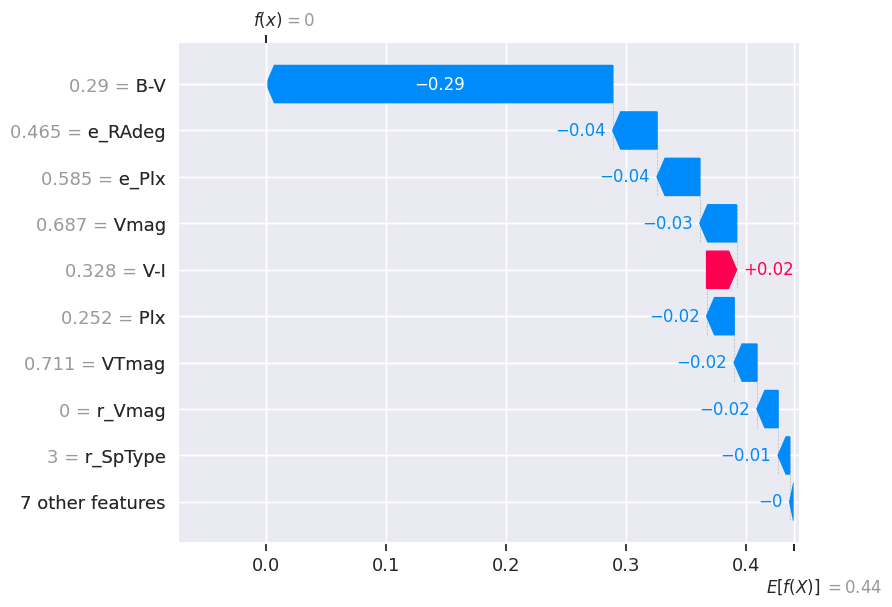

In [183]:
sample_feature_importance(0, 'waterfall')

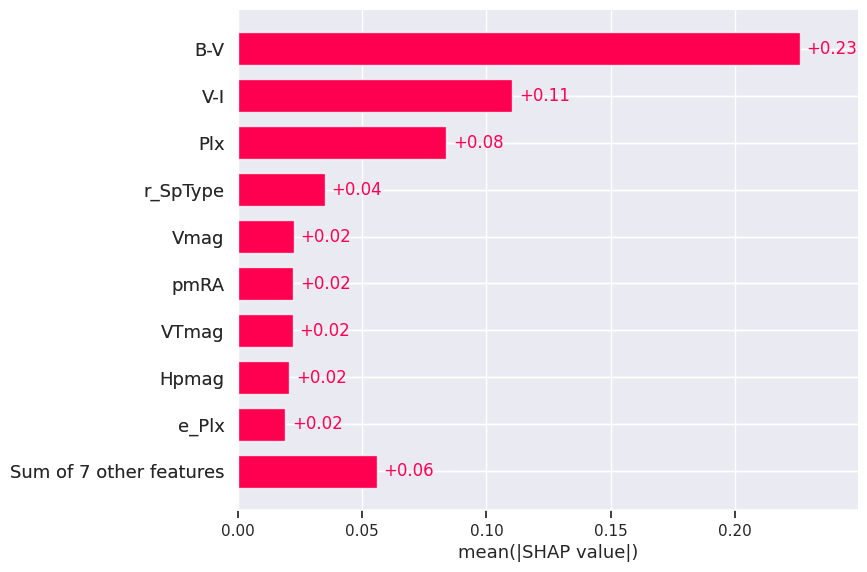

In [159]:
shap.plots.bar(shap_values)

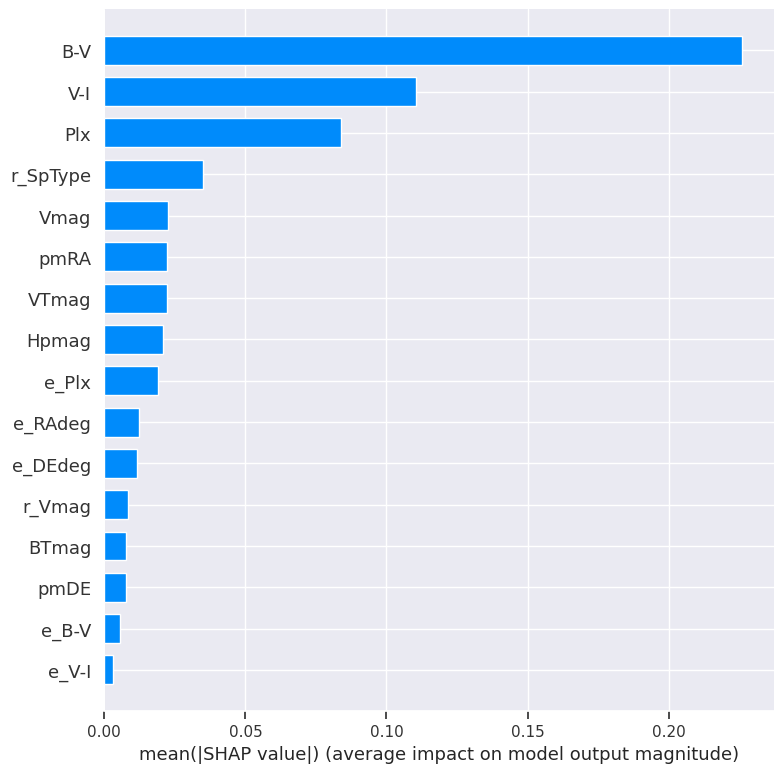

In [160]:
shap.summary_plot(shap_values.values, X_train, plot_type='bar')

In [161]:
import shap
shap.initjs()

In [166]:

catagorical_features = ['r_SpType']
numerical_features = [c for c in X_train.columns if c not in catagorical_features]
cat = [([c], [SimpleImputer(strategy='constant', fill_value=0),
              OrdinalEncoder()]) for c in catagorical_features]
num = [([n], [SimpleImputer(), StandardScaler()]) for n in numerical_features]
mapper = DataFrameMapper(num + cat, df_out=True)

In [167]:
pipeline = Pipeline([
    ('preprocess', mapper),
    ('reg', regr)
])
p = pipeline.fit(X_train, y_train)

In [168]:
explainer = shap.Explainer(pipeline.predict, X_train)
shap_values = explainer(X_test)

PermutationExplainer explainer: 151it [01:42,  1.33it/s]


In [169]:
def partial_dependence_plot(feature, idx=None):
    if idx is None: # visualize all samples
        shap.plots.partial_dependence(
            feature,
            pipeline.predict,
            X_train,
            ice=False,
            model_expected_value=True,
            feature_expected_value=True)
    else: # visualize sample idx
        shap.partial_dependence_plot(
            feature,
            pipeline.predict,
            X_train,
            ice=False,
            model_expected_value=True,
            feature_expected_value=True,
            shap_values=shap_values[idx:idx+1,:])

##Shap Dependency Plot

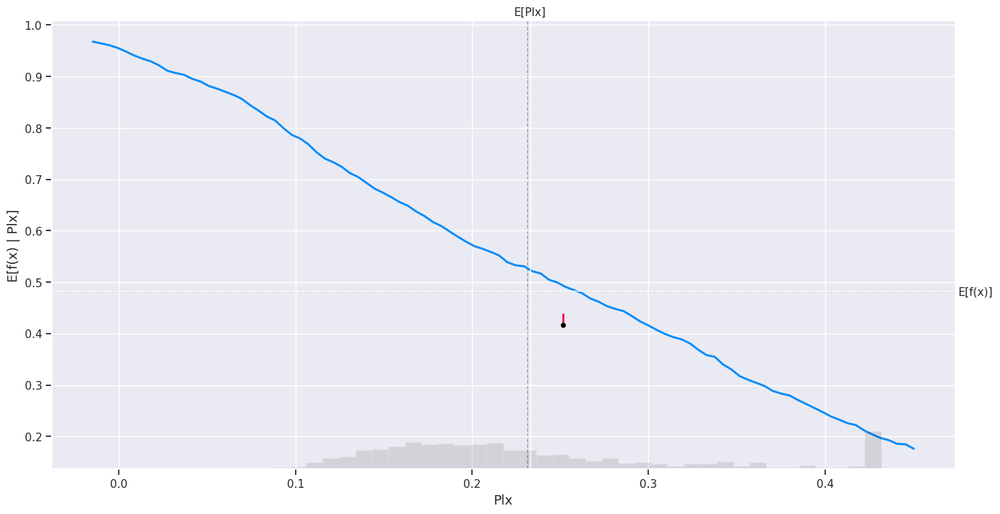

In [173]:
partial_dependence_plot('Plx', 0)

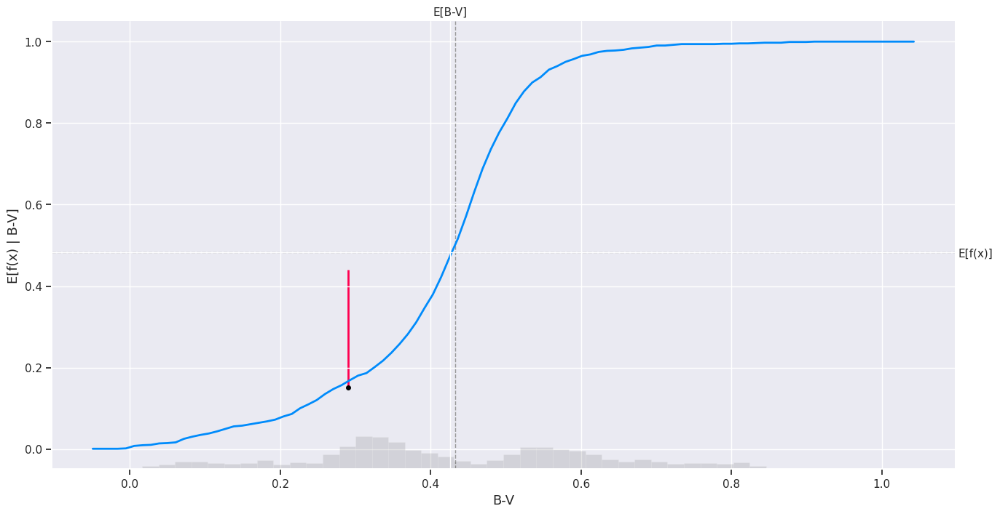

In [179]:
partial_dependence_plot('B-V', 0)

##Decision Tree

In [174]:
from sklearn.tree import DecisionTreeRegressor
DTree=DecisionTreeRegressor(max_depth=3, random_state=1234)
DTree.fit(X_train,y_train)

DTree_score = DTree.score(X_test, y_test)
print(DTree_score)

0.48282124116370007


In [175]:
from sklearn.metrics import r2_score,mean_absolute_error
def model_sel(model):
    y_pred = model.predict(X_test)
    print("MODEL EVALUATION")
    print("\nr2_score of the model: ")
    print(r2_score(y_test,y_pred))

In [176]:
# Model Evaluation on DecisionTreeRegressor
print("DECISION TREE REGRESSION: ")
print("-x"*25)
model_sel(DTree)

DECISION TREE REGRESSION: 
-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x-x
MODEL EVALUATION

r2_score of the model: 
0.48282124116370007


[Text(0.5, 0.875, 'B-V <= 0.484\nsquared_error = 0.25\nsamples = 1147\nvalue = 0.514'),
 Text(0.25, 0.625, 'r_SpType <= 3.5\nsquared_error = 0.169\nsamples = 666\nvalue = 0.216'),
 Text(0.125, 0.375, 'V-I <= 0.26\nsquared_error = 0.085\nsamples = 460\nvalue = 0.093'),
 Text(0.0625, 0.125, 'squared_error = 0.202\nsamples = 75\nvalue = 0.28'),
 Text(0.1875, 0.125, 'squared_error = 0.054\nsamples = 385\nvalue = 0.057'),
 Text(0.375, 0.375, 'Plx <= 0.136\nsquared_error = 0.25\nsamples = 206\nvalue = 0.49'),
 Text(0.3125, 0.125, 'squared_error = 0.122\nsamples = 35\nvalue = 0.857'),
 Text(0.4375, 0.125, 'squared_error = 0.243\nsamples = 171\nvalue = 0.415'),
 Text(0.75, 0.625, 'Plx <= 0.416\nsquared_error = 0.067\nsamples = 481\nvalue = 0.927'),
 Text(0.625, 0.375, 'Vmag <= 0.811\nsquared_error = 0.042\nsamples = 461\nvalue = 0.957'),
 Text(0.5625, 0.125, 'squared_error = 0.034\nsamples = 457\nvalue = 0.965'),
 Text(0.6875, 0.125, 'squared_error = 0.0\nsamples = 4\nvalue = 0.0'),
 Text(0.87

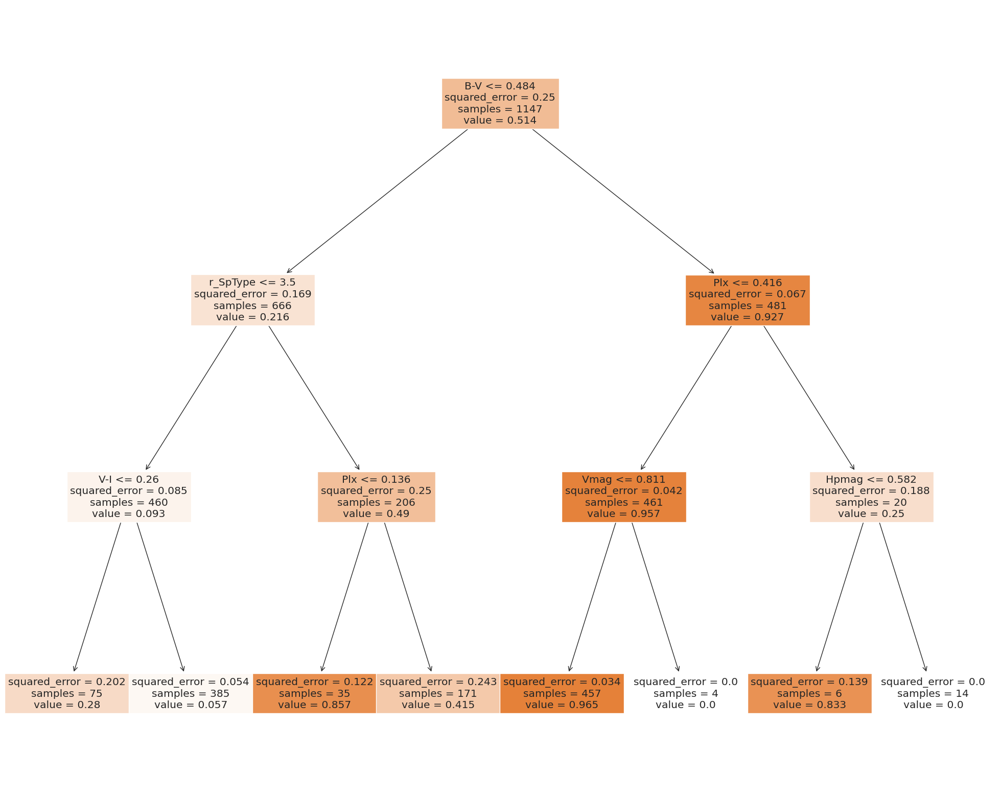

In [178]:
from sklearn import tree
from matplotlib import pyplot as plt
fig = plt.figure(figsize=(25,20))

tree.plot_tree(DTree, feature_names= df.columns, filled=True)

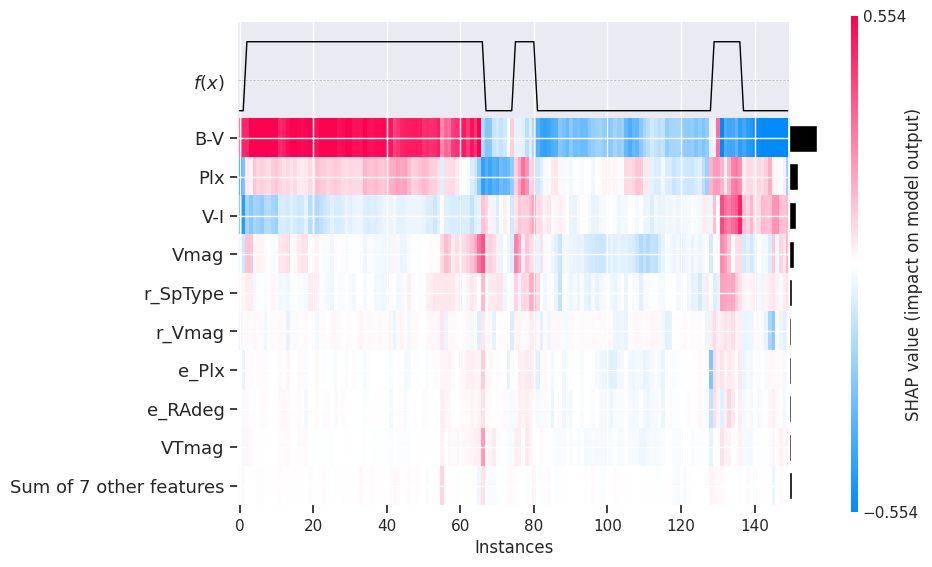

In [185]:
shap.plots.heatmap(shap_values)

#Final Report

 ## What is the question?
 The Aim of my project is to find the is to predict the spectral type of a star, specifically whether it is a Dwarf or a Giant, based on a set of attributes. These attributes are extracted from the Hipparcos catalog, which was created using data from the Hipparcos satellite, a mission by the European Space Agency to measure the positions, distances, and motions of stars with unprecedented precision.

## What did I do?
I have used Machine Learning Models:
1. **Logistic Regression**: This model is used for binary classification problems, in this case, to predict whether a star is a Dwarf or a Giant based on the given attributes.
2. **Random Forest**: This is an ensemble learning method that operates by constructing multiple decision trees during training and outputting the class that is the mode of the classes of the individual trees. It's used here for classifying the stars.
3. **AutoML**:Auto Machine Learning, is a powerful tool that can significantly simplify and expedite the process of developing machine learning models. It is especially beneficial for both novice and experienced practitioners in the field.This automates repetitive tasks such as data preprocessing, feature selection, model selection, and hyperparameter tuning. This allows data scientists to focus on more complex aspects of the problem.This gives better Accessibility,Efficiency,Optimization,Consistency,Scalability,Experimentation & Reduced Bias.

4. **Shap Analysis**: SHAP (SHapley Additive exPlanations) analysis is a method used to explain the output of machine learning models. It is based on game theory and provides a way to understand the contribution of each feature to the prediction made by the model.

### Predictions from Graphs:

- Visualize the distribution of the data and check for any patterns or outliers.
- Examine the relationship between different features and the target variable.
- Evaluate the performance of the machine learning models, such as by plotting the confusion matrix or ROC curve for classification tasks.
- Understand the importance of different features in the model, which can be visualized using SHAP values or feature importance plots in the case of Random Forest.

##How well did it work?




###Based on Data Cleaning and Feature Selection:
In summary, parallax and its associated error are the top predictors for spectral type, followed by visual magnitude and the errors in celestial coordinates, while the proper motions and B_T magnitude have minimal impact on the prediction of the spectral type of a star.
<br>Numeric Variables: HIP, BTmag, e_Plx, e_DEdeg, e_RAdeg, pmDE, pmRA, Plx, Vmag, rho, theta, Period, B-V, VTmag, V-I, Hpmag, e_B-V, e_V-I
Categorical Variables: RAhms, DEdms, MultFlag, HvarType, r_Vmag, r_SpType, SpType (target variable)
###Missing Values
####Columns with Significant Missing Values:
rho and theta have over 40,000 missing values each.
<br>MultFlag and Period are missing in over 38,000 and 44,000 rows, respectively.
<br>HvarType is missing in around 18,499 rows.
<br>Other columns like BTmag, VTmag, B-V, e_B-V, e_V-I have over 100 missing values.
###Smaller amounts of missing data in e_Plx, e_DEdeg, e_RAdeg, pmDE, pmRA, Plx, Hpmag. ​​
HIP: Appears to be uniformly distributed, likely an identifier.
<br>BTmag, VTmag, Vmag, Hpmag: These show varied distributions, with some skewness.
<br>e_Plx, e_DEdeg, e_RAdeg, pmDE, pmRA, Plx, rho, theta: These have distributions that are skewed or have long tails, suggesting outliers or specific ranges of concentration.
<br>B-V, V-I, e_B-V, e_V-I: These show somewhat normal or skewed distributions.
Period: Highly skewed with a concentration in lower values.

###Based on AutoML:
####For XGBoost_grid_1_model_16:

The most significant feature appears to be B-V.
The next two significant features could be Vmag and e_Plx, as they also show warmer colors compared to other features.
####For GBM_grid_1_model_2:

The top feature in terms of importance seems to be V-I.
Following that, Plx and r_SpType are also showing as important features for this model.
####For DRF_1:

The feature e_Radeg stands out as quite significant.
The features e_DEdeg and pmRA are also relatively significant for this model.
These features are the most influential for the model's predictions, according to the variable importance calculated by the models. Remember, the actual values of importance are not shown here, so this interpretation is based on the color gradients alone. In practice, you would want to look at the numerical values of importance to make a more precise assessment.


In the context of this heatmap, multicollinearity is indicated by correlation coefficients close to 1 or -1. Here are some observations:

1. **e_Plx** and **e_DEdeg** have a correlation of 0.87, which is quite high, suggesting multicollinearity.
2. **e_Plx** and **e_RAdeg**, as well as **e_DEdeg** and **e_RAdeg**, both have correlations above 0.8, which further suggests multicollinearity.
3. **pmRA** and **Plx** have a correlation of 0.74, also indicating potential multicollinearity.
4. There are very high correlations (close to or above 0.9) among **BTmag**, **Vmag**, **VTmag**, and **Hpmag**, which definitely suggests multicollinearity.
5. **B-V** has high correlations with **Vmag**, **VTmag**, and **V-I**, which could be problematic.

These high correlation coefficients suggest that there is significant multicollinearity in the model, which can be problematic because it undermines the statistical significance of an independent variable. One of the assumptions of ordinary least squares (OLS) regression is that the independent variables are not perfectly multicollinear.

In the multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.
####glm_regularization:
1.VTmag (31.17%)

2.BTmag (29.30%)

3.Plx (6.81%)

4.V-I (5.22%)

5.Vmag (4.08%)
####Ridge Regularization Model:
1.VTmag (28.31%)

2.BTmag (26.97%)

3.Plx (8.17%)

4.B-V (7.99%)

5.V-I (6.50%)

####Lasso Regularization Model:
1.VTmag (26.14%)

2.BTmag (25.04%)

3.B-V (9.87%)

4.Plx (8.79%)

5.V-I (6.81%)


#### Lamda Search Model
1.VTmag (28.64%)

2.BTmag (27.28%)

3.Plx (8.19%)

4.B-V (7.91%)

5.V-I (6.49%)

###Based On Shap Analysis
'BTmag', 'e_Plx', 'e_DEdeg', 'e_RAdeg', 'pmDE', 'pmRA', 'Plx', 'Vmag', 'B-V', 'VTmag', 'V-I', 'Hpmag', 'e_B-V', 'e_V-I', 'r_Vmag', 'r_SpType'are the features in the graph where
  VTMag, BTMag, Vmag are important features for random forest model.

BTmMag and VTmag are common top contributors in both models

By accuracy wise random forest model(93%) performed better compared to logistic regression(90.66). Additionally Auto ML recognized RidgeClassifier is 93%.

Shap values helped in visualising the feature importance for both the models

##What did I learn?
**Hyperparameters**:
Regarding the performance metrics, it seems that the model performs quite well on the training data with an R^2 of 0.9087605098851812, but there is a noticeable difference when it comes to cross-validation metrics with an R^2 of 0.6818334264091508. This suggests some overfitting, as the model is doing significantly better on the training data compared to new, unseen data (cross-validation).
- **model_id**: The unique identifier for each model.
- **rmse (Root Mean Squared Error)**: A measure of the differences between the predicted values and the actual values.
- **mse (Mean Squared Error)**: The average of the squares of the errors or deviations.
- **mae (Mean Absolute Error)**: The average of the absolute errors.
- **rmsle (Root Mean Squared Logarithmic Error)**: A measure of the differences between the logged predicted values and the logged actual values.
- **mean_residual_deviance**: The mean of the squared differences between the predicted values and the actual values.
- **training_time_ms**: The time taken to train the model, in milliseconds.
- **predict_time_per_row_ms**: The average time taken to make a prediction for each row, in milliseconds.
- **algo**: The algorithm used for the model.

From the leaderboard, we can see that various models have been generated, including Gradient Boosting Machines (GBM), Stacked Ensembles, and XGBoost models. The performance metrics indicate how well each model performed, with lower values for rmse, mse, mae, and rmsle indicating better performance.

The SHAP summary plot, which is mentioned in the context, shows the contribution of each feature to the prediction made by the model. This plot helps in understanding which features are most important in influencing the model's predictions.


#Conclusion:
In this dataset, we observe similar scores for B-V and V-I, aligning with expectations based on correlations from another dataset. Interestingly, there's a relatively high correlation between Plx and Vmag. While we see some correlation with other features, these four stand out as the strongest. It appears that we didn't require feature engineering to achieve nearly identical results.

The performance of the XG Boost model in this project is surprising, especially the second model that didn't use absolute magnitude. Moving forward, it would be insightful to investigate the feature importance assigned by the second model to understand its high performance. A potential next step could be to predict absolute magnitude based on the training set.

# References

1. Sckit learn offcial documentation
2. Refered Towards Data Science
3. Eli5 official documentation
4. Data Set :https://www.kaggle.com/datasets/konivat/hipparcos-star-catalog
5. Important Links: https://heasarc.gsfc.nasa.gov/W3Browse/all/hipparcos.html
6. AI SKUNKS :https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Full_ML_Report/Wine-Quality-Analysis.ipynb
- https://rstudio-pubs-static.s3.amazonaws.com/64286_2635bf8b05fb4423ac2968243211b46b.html
- https://docs.h2o.ai/h2o/latest-stable/h2o-docs/grid-search.html
- https://towardsdatascience.com/a-deep-dive-into-h2os-automl-4b1fe51d3f3e
The algorithms were referred directly from the **Sckit learn official documentation**. Visualization was referred from the  Machine Learning with scikit-learn Quick Start Guide and **Towards Data Science** (How do you check the quality of your regression model in Python?).  The remaining code was written independently. Feature importance reference is taken from **eli5 offical documnetation**